<a href="https://colab.research.google.com/github/TatianaLot/YP_projectmonth_2/blob/master/yp_pm2.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# Проект: предсказание покупок клиентов маркетплейса на основании исторических данных

**Цель:** предсказать покупки клиентов маркетплейсов на основании исторических данных о рекламных кампаниях и покупках клиентов

**Задачи:**
1. загрузка и предобработка данных
2. исследовательский анализ представленных данных, определение необходимых фичей
3. создание новых фичей и изучение их описательной статистики
4. корреляционный анализ
5. обучение моделей с подбором гиперпараметров и выбор наилучшей модели

**Данные:** исторические данные маркетплейса с мая 2022 по 1 квартал 2024, представленные в виде 5 датасетов: покупки, рекламные сообщения, целевая переменная, сводная информация о рекламенных кампаниях, сводная информация о рекламных кампаниях по каналам коммуникации


In [1]:
!pip install gdown -q
!pip install catboost -q
!pip install phik -q
!pip install optuna -q

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 99.2/99.2 MB 8.6 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 679.7/679.7 kB 10.5 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 404.7/404.7 kB 7.8 MB/s eta 0:00:00


In [2]:
from google.colab import drive
import pandas as pd
from collections import Counter
import json
import numpy as np
import matplotlib.pyplot as plt
from phik import phik_matrix
import seaborn as sns
import plotly.express as px

from sklearn.pipeline import Pipeline
from sklearn.preprocessing import MinMaxScaler, OneHotEncoder
from sklearn.compose import ColumnTransformer

from catboost import CatBoostClassifier, Pool
import optuna
from sklearn.ensemble import RandomForestClassifier
from lightgbm import LGBMClassifier

from sklearn.model_selection import StratifiedKFold, cross_val_score, train_test_split
from sklearn.metrics import confusion_matrix, classification_report, roc_auc_score, precision_score, recall_score


RANDOM_STATE = 16
THRESHOLD = 1800

In [5]:
!pip freeze > requirements.txt

## Загрузка и предобработка данных

План:
- загрузка всех датасетов
- изучение переменных и их типов
- проверка пропусков
- проверка дубликатов
- обработка пропусков и дубликатов (при необходимости)
- проверка пересечений по id клиентов

In [4]:
drive.mount('/content/drive')

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).


In [5]:
# Загрузка файлов
messages = pd.read_csv('/content/drive/My Drive/project2/apparel-messages.csv')
purchases = pd.read_csv('/content/drive/My Drive/project2/apparel-purchases.csv')
channel = pd.read_csv('/content/drive/My Drive/project2/full_campaign_daily_event_channel.csv')
daily = pd.read_csv('/content/drive/My Drive/project2/full_campaign_daily_event.csv')
target = pd.read_csv('/content/drive/My Drive/project2/apparel-target_binary.csv')

In [105]:
# Просмотр общей инфо о файлах

dfs = [messages, purchases, channel, daily, target]

dfs = {
    'messages': messages,
    'purchases': purchases,
    'channel': channel,
    'daily': daily,
    'target': target
}

for name, df in dfs.items():
    print(f'Статистика для {name}')
    df.info()
    print()
    print(f'Пропуски для {name}')
    print(df.isna().sum())
    print()
    print()
    print(f'Дубликаты для {name}')
    print(df.duplicated().sum())
    print()
    display(df.head(5))
    print()

Статистика для messages
<class 'pandas.core.frame.DataFrame'>
RangeIndex: 12739798 entries, 0 to 12739797
Data columns (total 7 columns):
 #   Column            Dtype         
---  ------            -----         
 0   bulk_campaign_id  int64         
 1   client_id         int64         
 2   message_id        object        
 3   event             object        
 4   channel           object        
 5   date              datetime64[ns]
 6   created_at        datetime64[ns]
dtypes: datetime64[ns](2), int64(2), object(3)
memory usage: 680.4+ MB

Пропуски для messages
bulk_campaign_id    0
client_id           0
message_id          0
event               0
channel             0
date                0
created_at          0
dtype: int64


Дубликаты для messages
48610



,bulk_campaign_id,client_id,message_id,event,channel,date,created_at
0,4439,1515915625626736623,1515915625626736623-4439-6283415ac07ea,open,email,2022-05-19,2022-05-19 00:14:20
1,4439,1515915625490086521,1515915625490086521-4439-62834150016dd,open,email,2022-05-19,2022-05-19 00:39:34
2,4439,1515915625553578558,1515915625553578558-4439-6283415b36b4f,open,email,2022-05-19,2022-05-19 00:51:49
3,4439,1515915625553578558,1515915625553578558-4439-6283415b36b4f,click,email,2022-05-19,2022-05-19 00:52:20
4,4439,1515915625471518311,1515915625471518311-4439-628341570c133,open,email,2022-05-19,2022-05-19 00:56:52



Статистика для purchases
<class 'pandas.core.frame.DataFrame'>
Index: 129188 entries, 0 to 202207
Data columns (total 6 columns):
 #   Column        Non-Null Count   Dtype         
---  ------        --------------   -----         
 0   client_id     129188 non-null  int64         
 1   quantity      129188 non-null  int64         
 2   price         129188 non-null  float64       
 3   category_ids  129188 non-null  object        
 4   date          129188 non-null  datetime64[ns]
 5   message_id    129188 non-null  object        
dtypes: datetime64[ns](1), float64(1), int64(2), object(2)
memory usage: 6.9+ MB

Пропуски для purchases
client_id       0
quantity        0
price           0
category_ids    0
date            0
message_id      0
dtype: int64


Дубликаты для purchases
0



,client_id,quantity,price,category_ids,date,message_id
0,1515915625468169594,1,1999.0,"['4', '28', '57', '431']",2022-05-16,1515915625468169594-4301-627b661e9736d
1,1515915625468169594,1,2499.0,"['4', '28', '57', '431']",2022-05-16,1515915625468169594-4301-627b661e9736d
2,1515915625471138230,1,6499.0,"['4', '28', '57', '431']",2022-05-16,1515915625471138230-4437-6282242f27843
3,1515915625471138230,1,4999.0,"['4', '28', '244', '432']",2022-05-16,1515915625471138230-4437-6282242f27843
4,1515915625471138230,1,4999.0,"['4', '28', '49', '413']",2022-05-16,1515915625471138230-4437-6282242f27843



Статистика для channel
<class 'pandas.core.frame.DataFrame'>
RangeIndex: 131072 entries, 0 to 131071
Data columns (total 37 columns):
 #   Column                           Non-Null Count   Dtype         
---  ------                           --------------   -----         
 0   date                             131072 non-null  datetime64[ns]
 1   bulk_campaign_id                 131072 non-null  int64         
 2   count_click_email                131072 non-null  int64         
 3   count_click_mobile_push          131072 non-null  int64         
 4   count_open_email                 131072 non-null  int64         
 5   count_open_mobile_push           131072 non-null  int64         
 6   count_purchase_email             131072 non-null  int64         
 7   count_purchase_mobile_push       131072 non-null  int64         
 8   count_soft_bounce_email          131072 non-null  int64         
 9   count_subscribe_email            131072 non-null  int64         
 10  count_unsubscribe_em

,date,bulk_campaign_id,count_click_email,count_click_mobile_push,count_open_email,count_open_mobile_push,count_purchase_email,count_purchase_mobile_push,count_soft_bounce_email,count_subscribe_email,...,nunique_hard_bounce_email,nunique_hbq_spam_email,nunique_send_email,count_soft_bounce_mobile_push,nunique_soft_bounce_mobile_push,count_complain_email,nunique_complain_email,count_close_mobile_push,nunique_close_mobile_push,month
0,2022-05-19,563,0,0,4,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,2022-05
1,2022-05-19,577,0,0,1,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,2022-05
2,2022-05-19,622,0,0,2,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,2022-05
3,2022-05-19,634,0,0,1,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,2022-05
4,2022-05-19,676,0,0,1,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,2022-05



Статистика для daily
<class 'pandas.core.frame.DataFrame'>
RangeIndex: 131072 entries, 0 to 131071
Data columns (total 25 columns):
 #   Column               Non-Null Count   Dtype         
---  ------               --------------   -----         
 0   date                 131072 non-null  datetime64[ns]
 1   bulk_campaign_id     131072 non-null  int64         
 2   count_click          131072 non-null  int64         
 3   count_complain       131072 non-null  int64         
 4   count_hard_bounce    131072 non-null  int64         
 5   count_open           131072 non-null  int64         
 6   count_purchase       131072 non-null  int64         
 7   count_send           131072 non-null  int64         
 8   count_soft_bounce    131072 non-null  int64         
 9   count_subscribe      131072 non-null  int64         
 10  count_unsubscribe    131072 non-null  int64         
 11  nunique_click        131072 non-null  int64         
 12  nunique_complain     131072 non-null  int64       

,date,bulk_campaign_id,count_click,count_complain,count_hard_bounce,count_open,count_purchase,count_send,count_soft_bounce,count_subscribe,...,nunique_purchase,nunique_send,nunique_soft_bounce,nunique_subscribe,nunique_unsubscribe,count_hbq_spam,nunique_hbq_spam,count_close,nunique_close,month
0,2022-05-19,563,0,0,0,4,0,0,0,0,...,0,0,0,0,0,0,0,0,0,2022-05
1,2022-05-19,577,0,0,0,1,0,0,0,0,...,0,0,0,0,0,0,0,0,0,2022-05
2,2022-05-19,622,0,0,0,2,0,0,0,0,...,0,0,0,0,0,0,0,0,0,2022-05
3,2022-05-19,634,0,0,0,1,0,0,0,0,...,0,0,0,0,0,0,0,0,0,2022-05
4,2022-05-19,676,0,0,0,1,0,0,0,0,...,0,0,0,0,0,0,0,0,0,2022-05



Статистика для target
<class 'pandas.core.frame.DataFrame'>
Index: 49849 entries, 1515915625468060902 to 1515915626010443624
Data columns (total 1 columns):
 #   Column  Non-Null Count  Dtype
---  ------  --------------  -----
 0   target  49849 non-null  int64
dtypes: int64(1)
memory usage: 778.9 KB

Пропуски для target
target    0
dtype: int64


Дубликаты для target
49847



,target
client_id,
1515915625468060902,0
1515915625468061003,1
1515915625468061099,0
1515915625468061100,0
1515915625468061170,0


Комментарии:
- Во всех датасетах есть проблема с переменными с датами, их необходимо перевести в datetime
- Данные в колонках соответствуют названиям переменных
- Пропусков в датасетах нет
- Необходимо удалить явные дубликаты

In [7]:
# Обработка дат
purchases['date'] = pd.to_datetime(purchases['date'])
messages['date'] = pd.to_datetime(messages['date'])
messages['created_at'] = pd.to_datetime(messages['created_at'])
daily['date'] = pd.to_datetime(daily['date'])
channel['date'] = pd.to_datetime(channel['date'])

In [104]:
# Обработка дубликатов
purchases = purchases.drop_duplicates()
messgaes = messages.drop_duplicates()

Комментарий: посмотрим, что у нас с пересечением id клиентов в 3 дф

In [9]:
# Проврека по id на пересечения клиентов в датасетах
s1 = set(purchases['client_id'])
s2 = set(messages['client_id'])
s3 = set(target['client_id'])


both_12 = s1 & s2
both_13 = s1 & s3
both_23 = s2 & s3

print('Пересекаются purchases и messages:', len(both_12))
print('Пересекаются purchases и target:', len(both_13))
print('Пересекаются messages и target:', len(both_23))

# клиенты, которые есть во всех трёх
common = s1 & s2 & s3
print('Есть во всех трёх:', len(common))

# клиенты, которые есть хотя бы в одном
union_123 = s1 | s2 | s3
print('Всего уникальных id во всех трёх:', len(union_123))

common_purchase_target = s1 & s3


Пересекаются purchases и messages: 41982
Пересекаются purchases и target: 49849
Пересекаются messages и target: 41982
Есть во всех трёх: 41982
Всего уникальных id во всех трёх: 61196


Комментарий: поскольку пропущена часть клиентов в messages, то надо решить можно ли заполнить информацию по этим клиентам заглушкой и использовать для анализа. Первоначальное решение было оставить только полные пересечения по клиентам, но с учетом дисбаланса классов в целевой переменной, действительно, более ценно оставить информацию о покупках бОльшего количества клиентов и заполнять инфо о рассылках заглушкамию

In [10]:
# Оставляем клиентов, которые есть в purchase и target
purchases_c = purchases[purchases['client_id'].isin(common_purchase_target)].copy()
messages_c = messages[messages['client_id'].isin(common_purchase_target)].copy()
target_c = target[target['client_id'].isin(common_purchase_target)].copy()

## Исследовательский анализ данных

План:
- Изучим информацию о датах, за которые представлены данные
- Общая описательная статистика по рекламных кампаниям и покупкам
- Общая описательная статистика по покупкам - сумма покупок и категории покупок
- Корреляционный анализ

In [11]:
# Функция для описательной статистики по количественным переменным
def quantitative_description(data, columns):
    for column in columns:
        col_name = column
        print(f'Описательная статистика по переменной: {col_name}')
        display(data[column].describe().round(1))
        fig = px.histogram(data, x=column)
        fig.update_layout(
        xaxis_title=col_name,
        yaxis_title='Количество наблюдений',
        title = f'Гистограмма по переменной: {col_name}')
        fig.show()
        fig = px.box(data, x=column)
        fig.update_layout(
        xaxis_title=col_name,
        title = f'Диаграмма размаха по переменной: {col_name}')
        fig.show()

In [12]:
# Функция для описательной статистики по категориальным переменным
def cat_analysis(data, columns):
    for column in columns:
        col_name = column
        fig = px.bar(data[column].value_counts(normalize = True).round(2))
        fig.update_traces(texttemplate='%{y}', textposition='outside')
        fig.update_layout(
        xaxis_title=col_name,
        yaxis_title='Доля наблюдений',
        title= f'Распределение по переменной: {col_name}')
        fig.show()

In [13]:
# Изучим информацию о датах в дф
print('Дата первого действия с рассылкой:', min(messages_c['created_at']))
print('Дата последнего действия с рассылкой:', max(messages_c['created_at']))
print('Дата первой покупки:', min(purchases_c['date']))
print('Дата последней покупки:', max(purchases_c['date']))
print('Дата первой рассылки по сводному дф:', min(daily['date']))
print('Дата последней рассылки по сводному дф:', max(daily['date']))
print('Дата первой рассылки по сводному дф по каналам:', min(channel['date']))
print('Дата последней рассылки по сводному дф по каналам:', max(channel['date']))

Дата первого действия с рассылкой: 2022-05-19 00:14:20
Дата последнего действия с рассылкой: 2024-02-15 23:58:40
Дата первой покупки: 2022-05-16 00:00:00
Дата последней покупки: 2024-02-16 00:00:00
Дата первой рассылки по сводному дф: 2022-05-19 00:00:00
Дата последней рассылки по сводному дф: 2024-05-15 00:00:00
Дата первой рассылки по сводному дф по каналам: 2022-05-19 00:00:00
Дата последней рассылки по сводному дф по каналам: 2024-05-15 00:00:00


Комментарий: у нас детальные данные с мая 2022 по февраль 2024, сводные данные у нас с мая 2022 по май 2024

In [14]:
# Новый признак с суммой покупки
purchases_c['amount'] = purchases_c['quantity']*purchases_c['price']

In [15]:
# Изучим информацию об общих цифрах
print('Количество уникальных клиентов:', messages_c['client_id'].nunique())
print('Количество уникальных кампаний:', messages_c['bulk_campaign_id'].nunique())
print('Количество уникальных сообщений', messages_c['message_id'].nunique())
print('Количество уникальных покупок:', purchases_c['client_id'].nunique())
print('Количество купленных товаров:', purchases_c['quantity'].sum())
print('Общая стоимость купленных товаров, руб.:', f"{purchases_c['amount'].sum():,.2f}")

Количество уникальных клиентов: 41982
Количество уникальных кампаний: 2706
Количество уникальных сообщений 7902124
Количество уникальных покупок: 49849
Количество купленных товаров: 130405
Общая стоимость купленных товаров, руб.: 164,561,611.00


In [16]:
# Изучим информацию о таргете
target['target'].value_counts(normalize = True)

,proportion
target,
0,0.980722
1,0.019278


Комментарий: у нас всего 2% наблюдений с классом 1, то есть наблюдается существенный дисбаланс классов

In [17]:
# Изучим информацию о каналах рассылки
print(messages_c['channel'].value_counts(normalize = True).map('{:.2%}'.format))

channel
mobile_push    55.88%
email          44.12%
Name: proportion, dtype: object


In [18]:
# Сводная статистика о колиестве рассылок на клиента по каналам

messages_client = messages_c.pivot_table(index = 'client_id', columns = 'channel', values = 'message_id', aggfunc = 'nunique')
messages_client = messages_client.rename(columns={'email': 'email_messages_cnt_unique', 'mobile_push': 'push_messages_cnt_unique'})



messages_client.describe()

channel,email_messages_cnt_unique,push_messages_cnt_unique
count,31895.000000,30359.000000
mean,113.842546,140.686979
std,52.947318,87.197123
min,1.000000,1.000000
25%,75.000000,73.000000
50%,123.000000,135.000000
75%,152.000000,212.000000
max,323.000000,2152.000000


In [19]:
# Изучим информацию о действиях с рассылками
print(messages_c['event'].value_counts(normalize = True).map('{:.2%}'.format))

event
send           72.13%
open           22.91%
click           4.16%
purchase        0.53%
hard_bounce     0.15%
soft_bounce     0.08%
unsubscribe     0.02%
hbq_spam        0.01%
complain        0.00%
subscribe       0.00%
close           0.00%
Name: proportion, dtype: object


In [20]:
# Изучим информацию о конверсии в разных каналах рассылок

ct = pd.crosstab(
    messages_c['event'],
    messages_c['channel'],
    margins=True,
    margins_name='All'
).drop('All', axis=0).sort_values('All', ascending=False)


base_email = ct['email'].iloc[0]
base_push = ct['mobile_push'].iloc[0]
base_total = ct['All'].iloc[0]

ct['email_pct_sent'] = (ct['email'] / base_email * 100).round(2)
ct['push_pct_sent'] = (ct['mobile_push'] / base_push * 100).round(2)
ct['pct_of_sent'] = (ct['All'] / base_total * 100).round(2)

ct = ct.drop(['email', 'mobile_push', 'All'], axis = 1)

display(ct)

channel,email_pct_sent,push_pct_sent,pct_of_sent
event,,,
send,100.00,100.00,100.00
open,22.61,39.55,31.77
click,9.13,2.91,5.77
purchase,1.06,0.44,0.73
hard_bounce,0.01,0.38,0.21
soft_bounce,0.22,0.02,0.11
unsubscribe,0.07,0.00,0.03
hbq_spam,0.02,0.00,0.01
complain,0.01,0.00,0.01


Комментарий:
- мобильные пуши отправлялись немного чаще по сравнению с емейлами
- конверсия в покупки по всем каналам 0.7%, что в целом ок для холодных контактов
- мобильные пуши открывают в два раза чаще, чем емейлы
- при этом конверсия в просмотры товаров (клики) намного выше именно у емейлов (видимо открывают емейлы более заинтересованные клиенты)
- конверсия в покупки также выше у емейлов

In [21]:
# Создадим переменные по месяцам, чтобы удобнее было смотреть динамику
daily['month'] = daily['date'].dt.to_period('M')
channel['month'] = channel['date'].dt.to_period('M')

In [22]:
# Свод по месяцам для визуализации динамики
campaigns = daily.groupby('month').agg({
    'bulk_campaign_id': 'nunique',
    'count_click': 'sum',
    'count_complain': 'sum',
    'count_hard_bounce': 'sum',
    'count_open': 'sum',
    'count_purchase': 'sum',
    'count_send': 'sum',
    'count_soft_bounce': 'sum',
    'count_subscribe': 'sum',
    'count_unsubscribe': 'sum'
}).reset_index()

display(campaigns.head(5))

,month,bulk_campaign_id,count_click,count_complain,count_hard_bounce,count_open,count_purchase,count_send,count_soft_bounce,count_subscribe,count_unsubscribe
0,2022-05,207,158380,0,57535,2801793,2622,12342966,32222,302,11384
1,2022-06,291,481065,0,1284173,7642305,8423,36983523,125054,1305,61513
2,2022-07,298,355569,0,102882,7945644,5940,32872229,67248,639,29889
3,2022-08,314,236252,0,166257,6510807,4745,27588208,61222,449,22659
4,2022-09,379,233598,0,397608,5652023,2175,25933653,31492,458,20816


In [106]:
# Сводная таблица по основным действиям с рассылками

campaigns = campaigns.rename(
    columns={
        'count_send': 'sent',
        'count_open': 'open',
        'count_click': 'click',
        'count_purchase': 'purchases'
    }
)
pivot_df = campaigns.pivot_table(
    index='month',
    values=['sent', 'open', 'click', 'purchases'],
    aggfunc='sum'
)
pivot_df.index = pivot_df.index.to_timestamp()

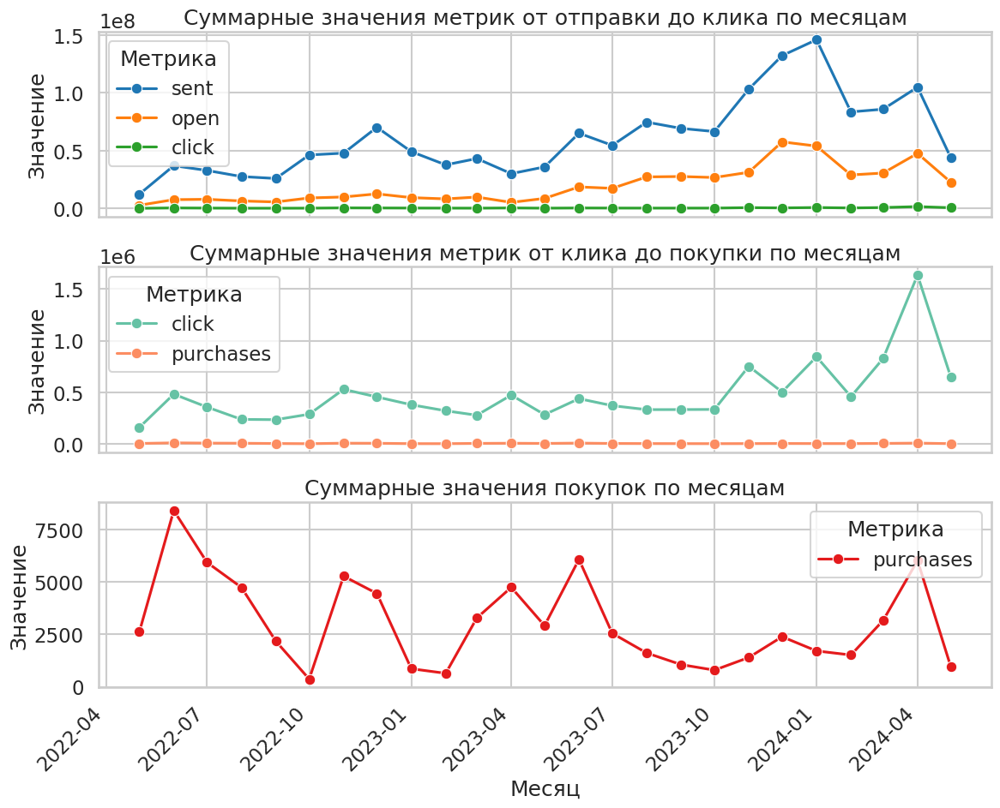

In [24]:
# Визуализация

top_metrics = ['sent', 'open', 'click']
middle_metrics = ['click', 'purchases']
purchases_metrics = ['purchases']

sns.set_theme(style='whitegrid', context='talk')

fig, axes = plt.subplots(3, 1, figsize=(12, 10), sharex=True)


plot_top = (
    pivot_df[top_metrics]
    .reset_index()
    .melt(id_vars='month', var_name='metric', value_name='value')
)

sns.lineplot(
    data=plot_top,
    x='month',
    y='value',
    hue='metric',
    marker='o',
    palette='tab10',
    ax=axes[0]
)
axes[0].set_title('Суммарные значения метрик от отправки до клика по месяцам')
axes[0].set_ylabel('Значение')
axes[0].legend(title='Метрика')


plot_middle = (
    pivot_df[middle_metrics]
    .reset_index()
    .melt(id_vars='month', var_name='metric', value_name='value')
)

sns.lineplot(
    data=plot_middle,
    x='month',
    y='value',
    hue='metric',
    marker='o',
    palette='Set2',
    ax=axes[1]
)
axes[1].set_title('Суммарные значения метрик от клика до покупки по месяцам')
axes[1].set_ylabel('Значение')
axes[1].legend(title='Метрика')


plot_purch = (
    pivot_df[purchases_metrics]
    .reset_index()
    .melt(id_vars='month', var_name='metric', value_name='value')
)

sns.lineplot(
    data=plot_purch,
    x='month',
    y='value',
    hue='metric',
    marker='o',
    palette='Set1',
    ax=axes[2]
)
axes[2].set_title('Суммарные значения покупок по месяцам')
axes[2].set_xlabel('Месяц')
axes[2].set_ylabel('Значение')
axes[2].legend(title='Метрика')

plt.xticks(rotation=45, ha='right')
plt.tight_layout()
plt.show()


Комментарии:
- мы видим, активизацию рассылок с осени 2023
- также с осени 2023 увеличилось количество открытый сообщений и кликов (в связи с тем, что самих рассылок стало больше)
- в продажах виден скорее тренд на их снижение с апреля 2024
- удивительно, но в продажах не видно сильной сезонности
- можно предположить, что в начале 2024 провели хорошую кампанию, которая привела к росту кликов и соответственнно покупок, но у нас нет данных по этой рассылке в исторических данных

In [25]:
# Посмотрим воронку по рассылкам с октября 2023 только

messages_23 = messages_c.query("date >= '2023-10-01'")

ct = pd.crosstab(
    messages_23['event'],
    messages_23['channel'],
    margins=True,
    margins_name='All'
).drop('All', axis=0).sort_values('All', ascending=False)


base_email = ct['email'].iloc[0]
base_push = ct['mobile_push'].iloc[0]
base_total = ct['All'].iloc[0]

ct['email_pct_sent'] = (ct['email'] / base_email * 100).round(2)
ct['push_pct_sent'] = (ct['mobile_push'] / base_push * 100).round(2)
ct['pct_of_sent'] = (ct['All'] / base_total * 100).round(2)

ct = ct.drop(['email', 'mobile_push', 'All'], axis = 1)

display(ct)

channel,email_pct_sent,push_pct_sent,pct_of_sent
event,,,
send,100.00,100.00,100.00
open,17.89,42.91,34.92
click,4.95,2.64,3.38
purchase,0.18,0.27,0.24
hard_bounce,0.00,0.28,0.19
soft_bounce,0.38,0.04,0.15
unsubscribe,0.08,0.00,0.03
subscribe,0.00,0.00,0.00
hbq_spam,0.00,0.00,0.00


Комментарий: эффективность рассылок с октября 23 стала существенно хуже

In [26]:
# Теперь посмотрим по каналам коммуникации

campaigns_channel = channel.groupby('month').agg({
    'bulk_campaign_id': 'nunique',
    'count_click_email': 'sum',
    'count_complain_email': 'sum',
    'count_hard_bounce_email': 'sum',
    'count_open_email': 'sum',
    'count_purchase_email': 'sum',
    'count_send_email': 'sum',
    'count_soft_bounce_email': 'sum',
    'count_subscribe_email': 'sum',
    'count_unsubscribe_email': 'sum',
    'count_click_mobile_push': 'sum',
    'count_hard_bounce_mobile_push': 'sum',
    'count_open_mobile_push': 'sum',
    'count_purchase_mobile_push': 'sum',
    'count_send_mobile_push': 'sum',
    'count_soft_bounce_mobile_push': 'sum'
}).reset_index()

display(campaigns_channel.head(5))

,month,bulk_campaign_id,count_click_email,count_complain_email,count_hard_bounce_email,count_open_email,count_purchase_email,count_send_email,count_soft_bounce_email,count_subscribe_email,count_unsubscribe_email,count_click_mobile_push,count_hard_bounce_mobile_push,count_open_mobile_push,count_purchase_mobile_push,count_send_mobile_push,count_soft_bounce_mobile_push
0,2022-05,207,140592,0,12821,1300532,2338,7527677,32222,302,11384,17788,44714,1501261,284,4815289,0
1,2022-06,291,456843,0,1145154,5712434,7808,31767247,125054,1305,61513,24222,139019,1929871,615,5216276,0
2,2022-07,298,301881,0,7209,3713522,4658,22604615,67248,639,29889,53688,95673,4232122,1282,10267614,0
3,2022-08,314,189242,0,8515,1793813,3961,15145398,61222,449,22659,47010,157742,4716994,784,12442810,0
4,2022-09,379,198752,0,90276,1733012,1967,14983813,31492,458,20816,34846,307332,3919011,208,10949840,0


In [27]:
campaigns_channel = campaigns_channel.rename(columns={
    'bulk_campaign_id': 'campaigns',
    'count_send_email': 'sent_emails',
    'count_open_email': 'open_emails',
    'count_click_email': 'click_emails',
    'count_purchase_email': 'purchases_emails'
})

pivot_emails = campaigns_channel.pivot_table(index = 'month', values = ['sent_emails', 'open_emails', 'click_emails', 'purchases_emails'],\
                                             aggfunc = 'sum')


pivot_emails.index = pivot_emails.index.to_timestamp()


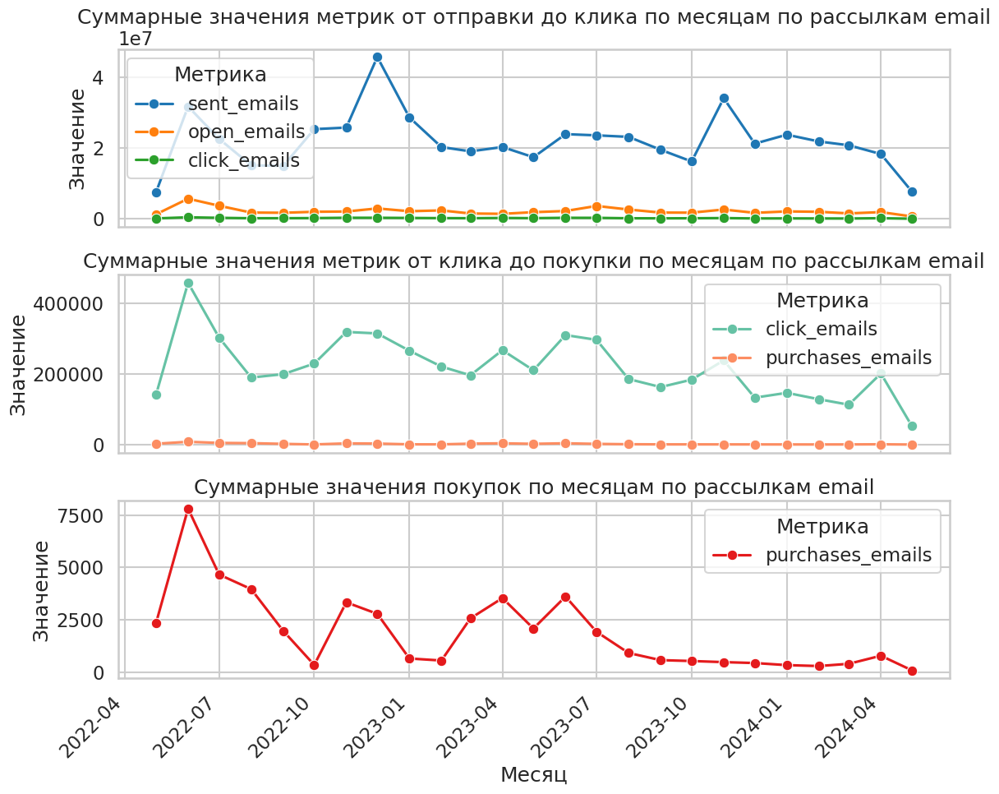

In [28]:
top_metrics = ['sent_emails', 'open_emails', 'click_emails']
middle_metrics = ['click_emails', 'purchases_emails']
purchases_metrics = ['purchases_emails']

sns.set_theme(style='whitegrid', context='talk')

fig, axes = plt.subplots(3, 1, figsize=(12, 10), sharex=True)


plot_top = (
    pivot_emails[top_metrics]
    .reset_index()
    .melt(id_vars='month', var_name='metric', value_name='value')
)

sns.lineplot(
    data=plot_top,
    x='month',
    y='value',
    hue='metric',
    marker='o',
    palette='tab10',
    ax=axes[0]
)
axes[0].set_title('Суммарные значения метрик от отправки до клика по месяцам по рассылкам email')
axes[0].set_ylabel('Значение')
axes[0].legend(title='Метрика')


plot_middle = (
    pivot_emails[middle_metrics]
    .reset_index()
    .melt(id_vars='month', var_name='metric', value_name='value')
)

sns.lineplot(
    data=plot_middle,
    x='month',
    y='value',
    hue='metric',
    marker='o',
    palette='Set2',
    ax=axes[1]
)
axes[1].set_title('Суммарные значения метрик от клика до покупки по месяцам по рассылкам email')
axes[1].set_ylabel('Значение')
axes[1].legend(title='Метрика')


plot_purch = (
    pivot_emails[purchases_metrics]
    .reset_index()
    .melt(id_vars='month', var_name='metric', value_name='value')
)

sns.lineplot(
    data=plot_purch,
    x='month',
    y='value',
    hue='metric',
    marker='o',
    palette='Set1',
    ax=axes[2]
)
axes[2].set_title('Суммарные значения покупок по месяцам по рассылкам email')
axes[2].set_xlabel('Месяц')
axes[2].set_ylabel('Значение')
axes[2].legend(title='Метрика')

plt.xticks(rotation=45, ha='right')
plt.tight_layout()
plt.show()


In [29]:
campaigns_channel = campaigns_channel.rename(columns={
    'bulk_campaign_id': 'campaigns',
    'count_send_mobile_push': 'sent_push',
    'count_open_mobile_push': 'open_push',
    'count_click_mobile_push': 'click_push',
    'count_purchase_mobile_push': 'purchases_push'
})

pivot_push = campaigns_channel.pivot_table(index = 'month', values = ['sent_push', 'open_push', 'click_push', 'purchases_push'],\
                                             aggfunc = 'sum')


pivot_push.index = pivot_push.index.to_timestamp()


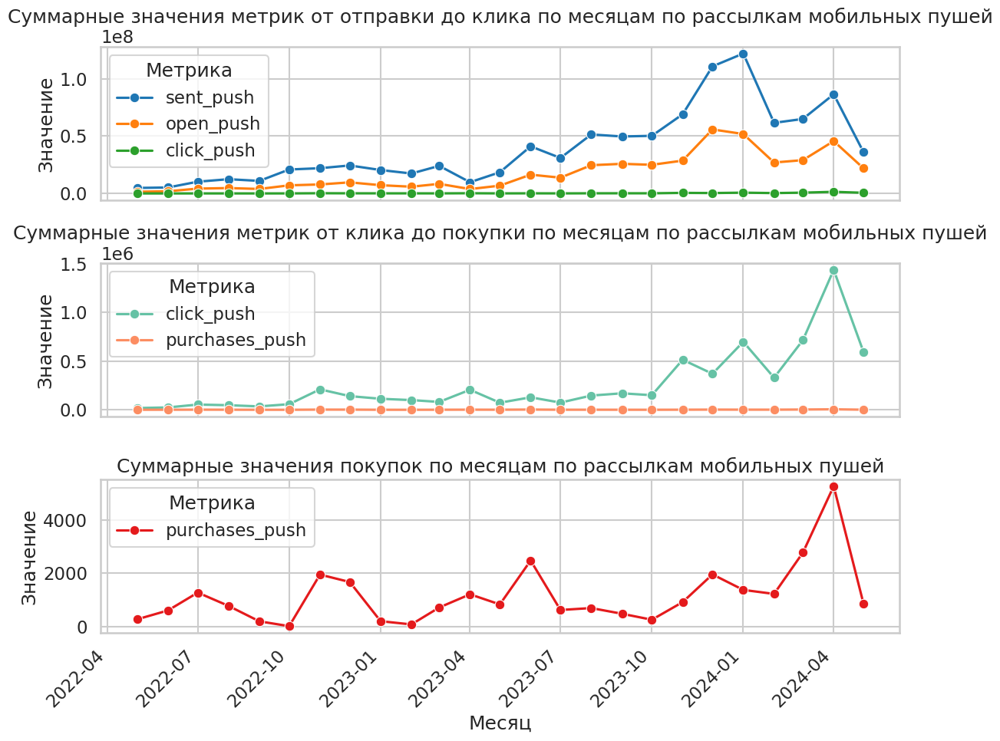

In [30]:
top_metrics = ['sent_push', 'open_push', 'click_push']
middle_metrics = ['click_push', 'purchases_push']
purchases_metrics = ['purchases_push']

sns.set_theme(style='whitegrid', context='talk')

fig, axes = plt.subplots(3, 1, figsize=(12, 10), sharex=True)


plot_top = (
    pivot_push[top_metrics]
    .reset_index()
    .melt(id_vars='month', var_name='metric', value_name='value')
)

sns.lineplot(
    data=plot_top,
    x='month',
    y='value',
    hue='metric',
    marker='o',
    palette='tab10',
    ax=axes[0]
)
axes[0].set_title('Суммарные значения метрик от отправки до клика по месяцам по рассылкам мобильных пушей')
axes[0].set_ylabel('Значение')
axes[0].legend(title='Метрика')


plot_middle = (
    pivot_push[middle_metrics]
    .reset_index()
    .melt(id_vars='month', var_name='metric', value_name='value')
)

sns.lineplot(
    data=plot_middle,
    x='month',
    y='value',
    hue='metric',
    marker='o',
    palette='Set2',
    ax=axes[1]
)
axes[1].set_title('Суммарные значения метрик от клика до покупки по месяцам по рассылкам мобильных пушей')
axes[1].set_ylabel('Значение')
axes[1].legend(title='Метрика')


plot_purch = (
    pivot_push[purchases_metrics]
    .reset_index()
    .melt(id_vars='month', var_name='metric', value_name='value')
)

sns.lineplot(
    data=plot_purch,
    x='month',
    y='value',
    hue='metric',
    marker='o',
    palette='Set1',
    ax=axes[2]
)
axes[2].set_title('Суммарные значения покупок по месяцам по рассылкам мобильных пушей')
axes[2].set_xlabel('Месяц')
axes[2].set_ylabel('Значение')
axes[2].legend(title='Метрика')

plt.xticks(rotation=45, ha='right')
plt.tight_layout()
plt.show()


Комментарий:
- по рассылкам емейл видим тренд на снижение как самих рассылок, так и покупок по этим рассылкам
- по рассылкам пушей видим как раз ранее отмеченный тренд на повышение активности, особенно с осени 2023
- по мобильным пушам также видно сильно влияние роста пушей на динамику продаж

In [31]:
# Посмотрим информацию по расходам и средней стоимости покупок, сначала сделаем периоды для анализа
purchases_c['month'] = purchases_c['date'].dt.to_period('M')

In [32]:
# Сгруппируем до клиента и до месяца
pivot_purch_amounts = purchases_c.groupby(by = ['client_id', 'month'], as_index=False).agg({
    'amount': 'sum',
    'quantity': 'sum'
})

In [33]:
# Посмотрим сводную информацию по расходам

pivot_amounts = pivot_purch_amounts.pivot_table(index = 'month', values = ['amount', 'quantity'],\
                                             aggfunc = 'sum')


pivot_amounts.index = pivot_amounts.index.to_timestamp()

pivot_amounts['average_purchase'] = (pivot_amounts['amount'] / pivot_amounts['quantity']).round(0)

display(pivot_amounts)



,amount,quantity,average_purchase
month,,,
2022-05-01,6535570.0,3878,1685.0
2022-06-01,17485468.0,12244,1428.0
2022-07-01,11310168.0,8219,1376.0
2022-08-01,9702590.0,6385,1520.0
2022-09-01,5355220.0,3659,1464.0
2022-10-01,938339.0,572,1640.0
2022-11-01,15070066.0,11967,1259.0
2022-12-01,13591206.0,11233,1210.0
2023-01-01,2522489.0,1805,1398.0


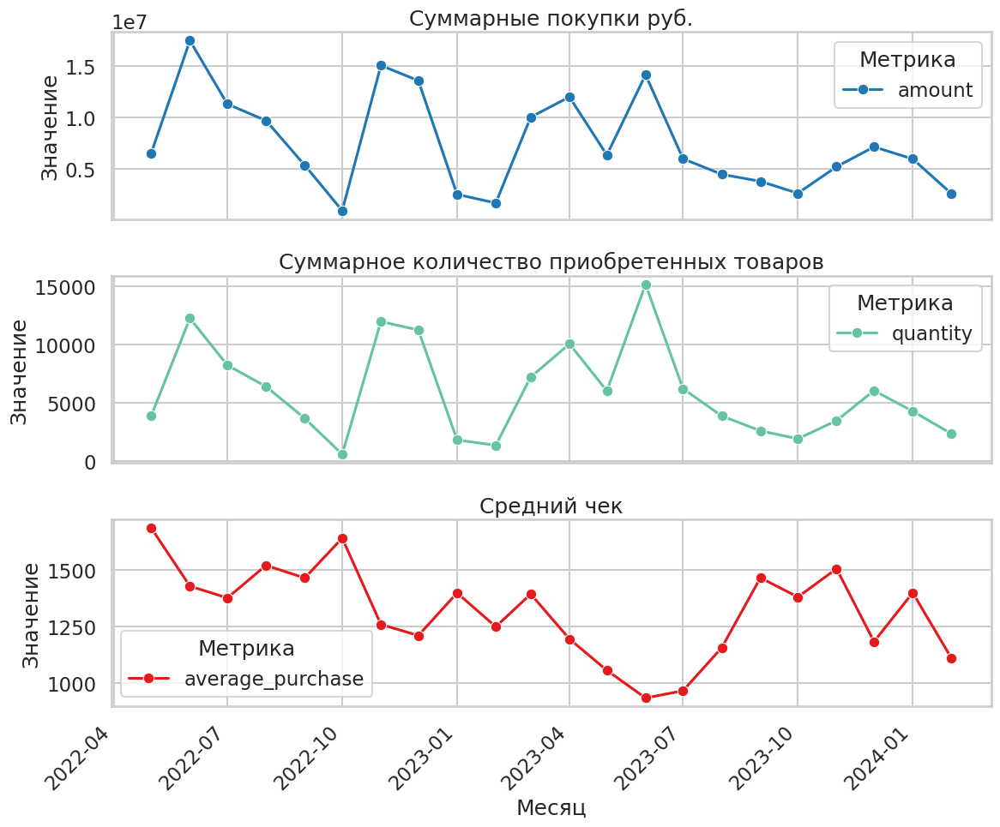

In [34]:
# Визуализация

sns.set_theme(style='whitegrid', context='talk')

fig, axes = plt.subplots(3, 1, figsize=(12, 10), sharex=True)


plot_amount = (
    pivot_amounts['amount']
    .reset_index()
    .melt(id_vars='month', var_name='metric', value_name='value')
)

sns.lineplot(
    data=plot_amount,
    x='month',
    y='value',
    hue='metric',
    marker='o',
    palette='tab10',
    ax=axes[0]
)
axes[0].set_title('Суммарные покупки руб.')
axes[0].set_ylabel('Значение')
axes[0].legend(title='Метрика')


plot_quantity = (
    pivot_amounts['quantity']
    .reset_index()
    .melt(id_vars='month', var_name='metric', value_name='value')
)

sns.lineplot(
    data=plot_quantity,
    x='month',
    y='value',
    hue='metric',
    marker='o',
    palette='Set2',
    ax=axes[1]
)
axes[1].set_title('Суммарное количество приобретенных товаров')
axes[1].set_ylabel('Значение')
axes[1].legend(title='Метрика')


plot_invoice = (
    pivot_amounts['average_purchase']
    .reset_index()
    .melt(id_vars='month', var_name='metric', value_name='value')
)

sns.lineplot(
    data=plot_invoice,
    x='month',
    y='value',
    hue='metric',
    marker='o',
    palette='Set1',
    ax=axes[2]
)
axes[2].set_title('Средний чек')
axes[2].set_xlabel('Месяц')
axes[2].set_ylabel('Значение')
axes[2].legend(title='Метрика')

plt.xticks(rotation=45, ha='right')
plt.tight_layout()
plt.show()


In [35]:
# Еще посмотрим чек на клиента

pivot_inv_client = pivot_purch_amounts.pivot_table(index = 'month', values = ['amount', 'quantity'],\
                                             aggfunc = 'mean')


pivot_inv_client.index = pivot_inv_client.index.to_timestamp()


display(pivot_inv_client)

,amount,quantity
month,,
2022-05-01,2758.788518,1.636978
2022-06-01,2967.159002,2.077719
2022-07-01,2439.113220,1.772482
2022-08-01,2575.680913,1.694983
2022-09-01,2722.531774,1.860193
2022-10-01,2688.650430,1.638968
2022-11-01,3312.830512,2.630688
2022-12-01,3097.357794,2.559936
2023-01-01,2724.070194,1.949244


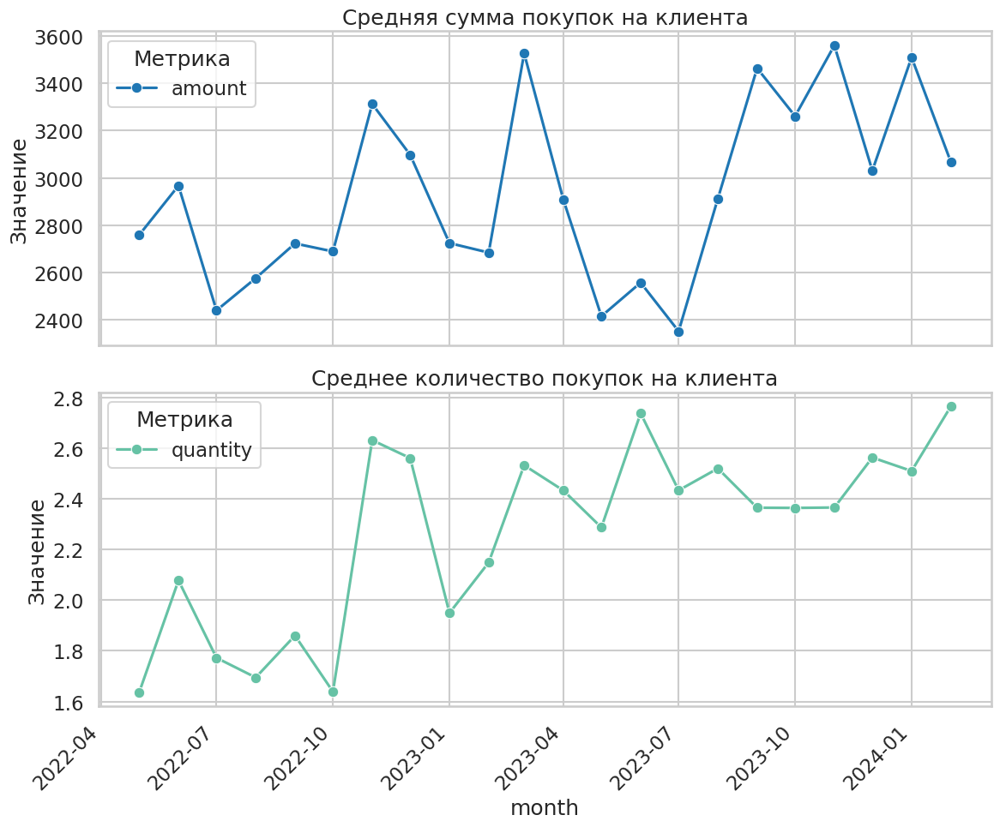

In [36]:
# Визуализация

sns.set_theme(style='whitegrid', context='talk')

fig, axes = plt.subplots(2, 1, figsize=(12, 10), sharex=True)


plot_amounts = (
    pivot_inv_client['amount']
    .reset_index()
    .melt(id_vars='month', var_name='metric', value_name='value')
)

sns.lineplot(
    data=plot_amounts,
    x='month',
    y='value',
    hue='metric',
    marker='o',
    palette='tab10',
    ax=axes[0]
)
axes[0].set_title('Средняя сумма покупок на клиента')
axes[0].set_ylabel('Значение')
axes[0].legend(title='Метрика')


plot_quantity = (
    pivot_inv_client['quantity']
    .reset_index()
    .melt(id_vars='month', var_name='metric', value_name='value')
)

sns.lineplot(
    data=plot_quantity,
    x='month',
    y='value',
    hue='metric',
    marker='o',
    palette='Set2',
    ax=axes[1]
)
axes[1].set_title('Среднее количество покупок на клиента')
axes[1].set_ylabel('Значение')
axes[1].legend(title='Метрика')



plt.xticks(rotation=45, ha='right')
plt.tight_layout()
plt.show()


In [37]:
# Еще посмотрим количество покупающих клиентов

pivot_client = pivot_purch_amounts.pivot_table(index = 'month', values = 'client_id',\
                                             aggfunc = 'nunique')


pivot_client.index = pivot_client.index.to_timestamp()


display(pivot_client)

,client_id
month,
2022-05-01,2369
2022-06-01,5893
2022-07-01,4637
2022-08-01,3767
2022-09-01,1967
2022-10-01,349
2022-11-01,4549
2022-12-01,4388
2023-01-01,926


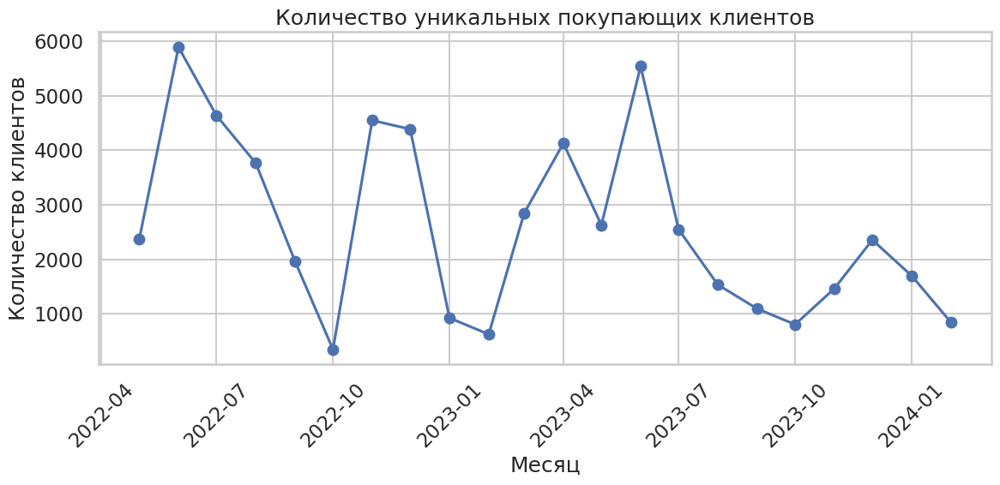

In [38]:
# Визуализация
sns.set_theme(style='whitegrid', context='talk')

fig, ax = plt.subplots(figsize=(12, 6))


ax.plot(
    pivot_client.index,
    pivot_client['client_id'],
    marker='o'
)

ax.set_title('Количество уникальных покупающих клиентов')
ax.set_ylabel('Количество клиентов')
ax.set_xlabel('Месяц')

ax.tick_params(axis='x', rotation=45)

plt.tight_layout()
plt.show()


Комментарии:
- видим, что в наблюдаемом периоде снижается общая сумма и количество приобретенных товаров
- также видим, что у нас растет средняя сумма трат на клиента и среднее колиество покупок на клиента
- однако само количество активных и покупающих клиентов у нас снижается с середины 2023 года несмотря на рост интенсивности рекламных кампаний (вероятно, кампании "бьют" эффективно не во все категории клиентов)
- видим также на сводном датасете, что кривая по покупкам имеет такую же форму, как кривые по отправленным пушам и кликам по пушам, то есть эти переменные точно нужны для нашей модели


В целом можно сделать вывод, что последние полгода покупательское поведение существенно отличается от начальных периодов, представленных в датасете

In [39]:
# Посмотрим информацию по категориям покупок
ids = list(purchases.category_ids)
ids = [id.replace("'", '"') for id in ids if id != '[None]']
ids = [json.loads(id) for id in ids]
ids = [id for id in ids if len(id) > 1]
Counter([len(id) for id in ids])

Counter({4: 124747, 5: 345, 3: 736})

Комментарий: большинство покупок у нас находятся в справочнике из 4 уровней, максимальное количество уровней ирерахии 5. Разобьем таким образом категории на 5 переменных по уровням

In [107]:
# Обработка категорий и создании новых фичей
def parse_ids(val):
    if val == '[None]' or val is None:
        return []
    s = val.replace("'", '"')
    lst = json.loads(s)
    return lst if len(lst) > 1 else []

# Получаем список категорий для каждой строки
ids = [parse_ids(v) for v in purchases_c['category_ids']]

# Разворачиваем по уровням
max_levels = 5
for i in range(max_levels):
    purchases_c[f'lvl_{i+1}'] = [
        row[i] if len(row) > i else np.nan   # или None
        for row in ids
    ]

In [41]:
# Посмотрим какая вариация на самом верхнем уровне категорий
purchases_c['lvl_1'].value_counts()


,count
lvl_1,
4,73428
5562,29148
2,17995
6060,4458
5963,789
3,6
1,3
5,1


Комментарий: 1, 3 и 5 категории для анализа ценности не имеют, потому что в них нет наблюдений. Их уберем, чтобы не усложнять визуализацию и анализ

In [42]:
# Посмотрим как соотносятся категории первого и второго уровня
lvl_1_cats = ['4', '5562', '2', '6060', '5963']
purch_selected = purchases_c[purchases_c['lvl_1'].isin(lvl_1_cats)]
cats_pivot = purch_selected.pivot_table(index = 'lvl_2', columns = 'lvl_1', values = 'client_id', aggfunc = 'count')
display(cats_pivot)

lvl_1,2,4,5562,5963,6060
lvl_2,,,,,
17,1959.0,NaN,NaN,NaN,NaN
18,16036.0,NaN,NaN,NaN,NaN
1822,NaN,2476.0,NaN,NaN,NaN
27,NaN,7223.0,NaN,NaN,NaN
28,NaN,53564.0,NaN,NaN,NaN
29,NaN,3280.0,NaN,NaN,NaN
30,NaN,59.0,NaN,NaN,NaN
31,NaN,5562.0,NaN,NaN,NaN
44,NaN,705.0,NaN,NaN,NaN


In [43]:
# Еще посмотрим количество покупающих клиентов по верхним уровням категорий

pivot_purch_cat = purch_selected.groupby(by = ['client_id', 'month', 'lvl_1'], as_index=False).agg({
    'amount': 'sum',
    'quantity': 'sum'
})

pivot_client_cat = pivot_purch_cat.pivot_table(index = 'month', columns = 'lvl_1', values = 'client_id',\
                                             aggfunc = 'nunique')


pivot_client_cat.index = pivot_client_cat.index.to_timestamp()

pivot_client_cat = pivot_client_cat.fillna(0)


display(pivot_client_cat)

lvl_1,2,4,5562,5963,6060
month,,,,,
2022-05-01,529.0,1647.0,381.0,0.0,0.0
2022-06-01,1209.0,4349.0,1065.0,0.0,0.0
2022-07-01,917.0,3347.0,785.0,0.0,0.0
2022-08-01,684.0,2523.0,880.0,0.0,0.0
2022-09-01,469.0,1313.0,359.0,0.0,0.0
2022-10-01,70.0,236.0,60.0,0.0,0.0
2022-11-01,799.0,2846.0,1526.0,25.0,1.0
2022-12-01,759.0,2546.0,1149.0,104.0,398.0
2023-01-01,192.0,623.0,139.0,4.0,32.0


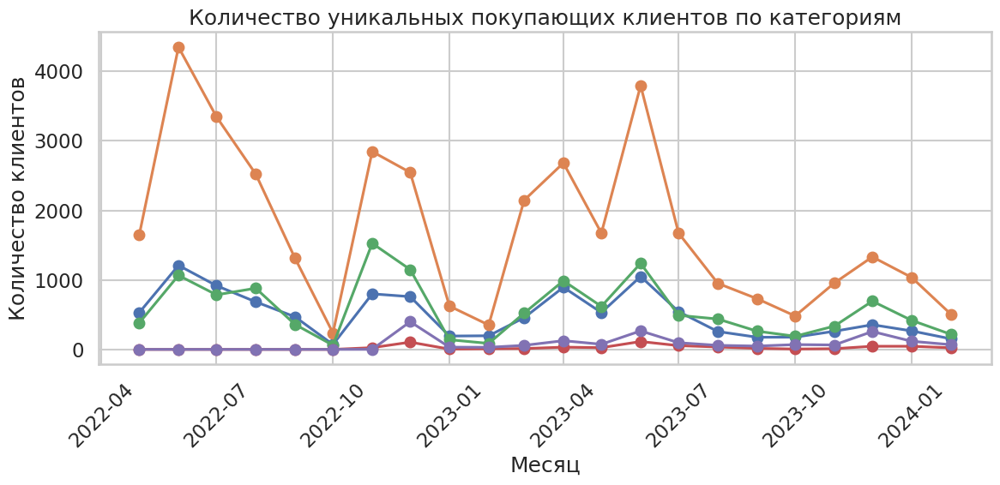

In [44]:
# Визуализация
sns.set_theme(style='whitegrid', context='talk')

fig, ax = plt.subplots(figsize=(12, 6))


ax.plot(
    pivot_client_cat.index,
    pivot_client_cat[['2', '4', '5562', '5963', '6060']],
    marker='o'
)

ax.set_title('Количество уникальных покупающих клиентов по категориям')
ax.set_ylabel('Количество клиентов')
ax.set_xlabel('Месяц')

ax.tick_params(axis='x', rotation=45)

plt.tight_layout()
plt.show()

In [45]:
# Посмотрим цены по месяцам по категориям
pivot_price_cat = pivot_purch_cat.pivot_table(index = 'month', columns = 'lvl_1', values = ['amount', 'quantity'],\
                                             aggfunc = 'sum')

price_by_month = pivot_price_cat['amount'] / pivot_price_cat['quantity']

display(price_by_month)

lvl_1,2,4,5562,5963,6060
month,,,,,
2022-05,1925.758242,1725.143305,1220.808725,NaN,NaN
2022-06,1636.407222,1478.834596,995.463566,NaN,NaN
2022-07,1608.785928,1419.487787,983.311828,NaN,NaN
2022-08,1793.375130,1549.181054,1271.233154,NaN,NaN
2022-09,1613.671171,1628.596842,1120.214493,NaN,NaN
2022-10,2098.268817,1816.725714,1186.488889,NaN,NaN
2022-11,1891.347292,1671.535992,632.025198,683.542857,42.000000
2022-12,1852.097843,1549.166951,817.590924,1456.786207,330.618637
2023-01,1814.763251,1629.770147,814.281513,1727.000000,236.610526


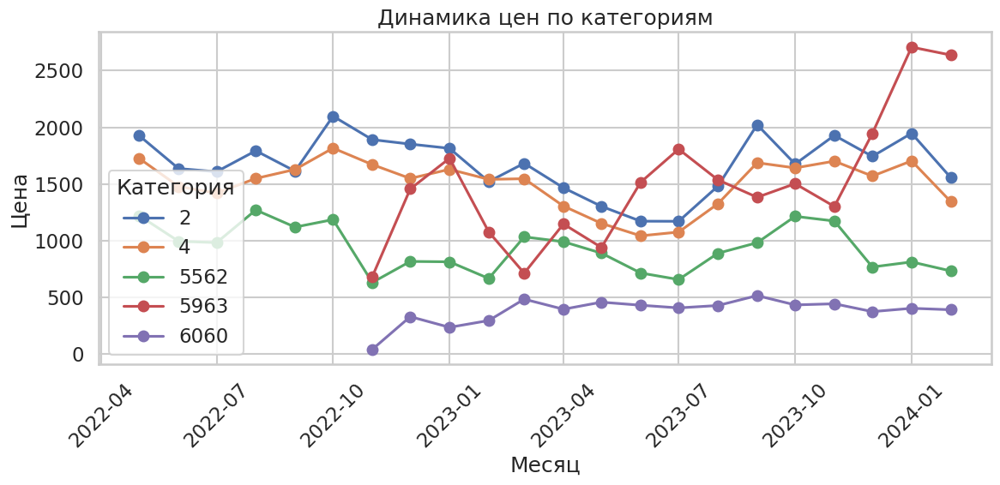

In [46]:
# Визуализация
sns.set_theme(style='whitegrid', context='talk')

fig, ax = plt.subplots(figsize=(12, 6))

x = price_by_month.index.to_timestamp()  # превращаем PeriodIndex в DatetimeIndex

ax.plot(
    x,
    price_by_month[['2', '4', '5562', '5963', '6060']],
    marker='o'
)

ax.set_title('Динамика цен по категориям')
ax.set_ylabel('Цена')
ax.set_xlabel('Месяц')

ax.legend(price_by_month[['2', '4', '5562', '5963', '6060']].columns, title='Категория')

ax.tick_params(axis='x', rotation=45)

plt.tight_layout()
plt.show()

Комментарий:
- динамика количества уникальных клиентов, совершивших покупку, по категориям 1 уровня одинаковая, то есть нет такого, то упала какая-то конкретная категория
- средние цены товаров по категориям не имеют выраженной динамики, кроме категории "5963", но в ней наименьшее количество наблюдений и эта динамика может быть выбросом. Чтобы детальнее понять динамику надо тут обратиться к авторам данных и разобраться, что это за категория
- видим, что категории отличаются между собой по цене, где "2" самая дорогостоящая, а "6060" самая дешевая

С учетом указанных выше наблюдений и того, что в переменной с таргетом очень мало наблюдений с классом 1, есть предположение, что детальные фичи по категориям и подкатегориям будут не очень полезными. Тем не менее можно предложить следующие фичи:
- количество покупок в категориях 1го уровня и наиболее предпочитаемая категория 2го уровня в интересующий нас период (например, последнее полугодие)
- частота покупок в каждой категории первого уровня
- количество дней с момента покупки в каждой категории

**Выводы:**
- таким образом относительно рекламных компаний предлагается создать следующие фичи с детализацией до клиента: количество открытых рекламных кампаний на клиента, количество рекламных кампаний с 2024 года (они непосредственно влияют на покупки в следующем периоде, как видели выше),количество переходов по рекламным кампания, количество дней с последнего действия клиента с рассылкой, последнее действие с рассылкой, конверсия на клиента в клики и продажи от отправленных рассылок
- по покупкам предлагается создать следующие фичи: давность клиента (время от первой до последней покупки), частота покупок клиента, количество покупок по категориям 1го уровня, предпочитаемая категория 2го уровня,  количество дней с момента последней покупки по категориям 1го уровня

## Новые фичи и их описательная статистика

План работ:
- создать фичи по рекламным кампаниями последовательно с помощью нескольких группировок и сводных таблиц и потом объединить в единый дф, изучить описательную статистику по полученным переменным и отобрать фичи для обучения моделей
- создать фичи по категориям покупок и изучить описательную статистику по этим фичам
- создать фичи по сумме покупок и изучить описательную статистику по этим фичам
- отобрать фичи на основании корреляционного аналиаз

In [47]:
# Порог для анализа по давности наблюдений (идея не взлетела, поэтому в анализе весь период)

max_date = messages_c['date'].max()

threshold = max_date - pd.Timedelta(days=THRESHOLD)

messages_c['period_type'] = (messages_c['date'] >= threshold).astype(int)
messages_c.head(10)

,bulk_campaign_id,client_id,message_id,event,channel,date,created_at,period_type
0,4439,1515915625626736623,1515915625626736623-4439-6283415ac07ea,open,email,2022-05-19,2022-05-19 00:14:20,1
1,4439,1515915625490086521,1515915625490086521-4439-62834150016dd,open,email,2022-05-19,2022-05-19 00:39:34,1
2,4439,1515915625553578558,1515915625553578558-4439-6283415b36b4f,open,email,2022-05-19,2022-05-19 00:51:49,1
3,4439,1515915625553578558,1515915625553578558-4439-6283415b36b4f,click,email,2022-05-19,2022-05-19 00:52:20,1
4,4439,1515915625471518311,1515915625471518311-4439-628341570c133,open,email,2022-05-19,2022-05-19 00:56:52,1
5,4439,1515915625594606468,1515915625594606468-4439-6283411f277fc,open,email,2022-05-19,2022-05-19 01:04:11,1
6,4439,1515915625491810918,1515915625491810918-4439-6283411d9d299,open,email,2022-05-19,2022-05-19 01:19:54,1
7,4439,1515915625474219766,1515915625474219766-4439-628341212233a,open,email,2022-05-19,2022-05-19 01:23:43,1
8,4439,1515915625474219766,1515915625474219766-4439-628341212233a,click,email,2022-05-19,2022-05-19 01:24:16,1
9,4439,1515915625566741491,1515915625566741491-4439-6283412871599,open,email,2022-05-19,2022-05-19 01:31:06,1


In [48]:
messages_c_period = messages_c[messages_c['period_type']==1]

In [49]:
# Сводная статистика о количестве рассылок на клиента по каналам и заполнение пропусков

messages_client = messages_c_period.pivot_table(index = 'client_id', columns = 'channel', values = 'message_id', aggfunc = 'nunique')
messages_client = messages_client.rename(columns={'email': 'email_messages_cnt_unique', 'mobile_push': 'push_messages_cnt_unique'})

messages_client = messages_client.fillna(0)

In [108]:
# Сводная статистика о количестве рассылок на клиента по каналам и заполнение пропусков с 24 года

messages_24 = messages_c_period.query("date >= '2024-01-01'")
messages_client_24 = messages_24.pivot_table(index = 'client_id', columns = 'channel', values = 'message_id', aggfunc = 'nunique')
messages_client_24 = messages_client_24.rename(columns={'email': 'email_messages_cnt_unique_24', 'mobile_push': 'push_messages_cnt_unique_24'})

messages_client24 = messages_client_24.fillna(0)

In [51]:
# Подготовка для последующего выделения последнего действия клиента
messages_c_period['last_action_rank'] = messages_c_period.groupby(['client_id'])['created_at'] \
                    .rank(method='first', ascending=False)
messages_c_period['last_action_rank_per_message'] = messages_c_period.groupby(['client_id', 'message_id'])['created_at'] \
                    .rank(method='first', ascending=False)


In [52]:
# Референсная дата для расчета количества дней
ref_date = messages_c_period['created_at'].max()

In [53]:
# Расчет последнего действия и количества дней с последнего действия, заполнение пропусков заглушкой

messages_last_action = messages_c_period[['client_id', 'channel', 'event', 'created_at', 'last_action_rank']][messages_c_period['last_action_rank'] == 1]

messages_last_action['days_since_last_action'] = ((ref_date - messages_last_action['created_at']).dt.days)
messages_last_action = messages_last_action.drop(['created_at', 'last_action_rank'], axis = 1)
messages_last_action = messages_last_action.set_index('client_id')




In [54]:
# Сводная статистика по каналам и дням с последнего действия

messages_last_action_pivot = messages_last_action.pivot_table(index = 'event', columns = 'channel', values = 'days_since_last_action',\
                                                              aggfunc = 'mean')



display(messages_last_action_pivot.sort_values(by = 'mobile_push'))


channel,email,mobile_push
event,,
send,16.555134,11.392849
open,81.871368,12.653795
soft_bounce,8.898990,39.322581
click,272.057402,50.210216
hard_bounce,333.068182,170.624101
purchase,417.227064,292.306667
complain,364.612500,NaN
unsubscribe,217.419149,NaN


Комментарий: кажется, что в данных достаточно много клиентов, которые давно ничего не покупали, поэтому среднее время с момента последней покупки очень значительное

In [55]:
# Сводная статистика по действиям с рекламным сообщением: количество открытых сообщений по каналам

messages_client_open = messages_c_period[['client_id', 'channel', 'message_id']][messages_c_period['event'] == 'open']
messages_open_pivot = messages_client_open.pivot_table(index = 'client_id', columns = 'channel', values = 'message_id', aggfunc = 'nunique')
messages_open_pivot = messages_open_pivot.rename(columns={'email': 'email_opened', 'mobile_push': 'push_opened'})
messages_open_pivot  = messages_open_pivot.fillna(0)
messages_open_pivot.describe()

channel,email_opened,push_opened
count,34747.000000,34747.000000
mean,20.468933,47.425015
std,26.240945,69.716664
min,0.000000,0.000000
25%,4.000000,0.000000
50%,11.000000,2.000000
75%,26.000000,82.000000
max,301.000000,1117.000000


In [56]:
# Сводная статистика по действиям с рекламным сообщением: количество переходов

messages_client_click = messages_c_period[['client_id', 'channel', 'message_id']][messages_c_period['event'] == 'click']
messages_click_pivot = messages_client_click.pivot_table(index = 'client_id', columns = 'channel', values = 'message_id', aggfunc = 'nunique')
messages_click_pivot = messages_click_pivot.rename(columns={'email': 'email_click', 'mobile_push': 'push_click'})
messages_click_pivot = messages_click_pivot.fillna(0)
messages_click_pivot.describe()

channel,email_click,push_click
count,39458.000000,39458.000000
mean,5.537356,2.685767
std,8.211089,6.689559
min,0.000000,0.000000
25%,0.000000,0.000000
50%,3.000000,0.000000
75%,7.000000,3.000000
max,94.000000,234.000000


In [57]:
# Сводная статистика по действиям с рекламным сообщением: количество покупок

messages_client_purchase = messages_c_period[['client_id', 'channel', 'message_id']][messages_c_period['event'] == 'purchase']
messages_purchase_pivot = messages_client_purchase.pivot_table(index = 'client_id', columns = 'channel', values = 'message_id', aggfunc = 'nunique')
messages_purchase_pivot = messages_purchase_pivot.rename(columns={'email': 'email_purchase', 'mobile_push': 'push_purchase'})
messages_purchase_pivot = messages_purchase_pivot.fillna(0)
messages_purchase_pivot.describe()

channel,email_purchase,push_purchase
count,37485.000000,37485.000000
mean,0.804802,0.382153
std,0.773155,0.610238
min,0.000000,0.000000
25%,0.000000,0.000000
50%,1.000000,0.000000
75%,1.000000,1.000000
max,32.000000,14.000000


Комментарий:
- Среднее количество открытых емейлов на клиента за все время 20, мобильных пушей - 47. При этом 50% клиентов за все время открыли не более 11 емейлов и не более 2 пушей
- Среднее количество переходов к товарам на клиента за все время по емейлам составляет 5,5, а для пушей 2.7. При этом 50% клиентов совершили не более 3 переходов по емейлам и 0 переходов по пушам.
- Есть и любители рекламных рассылок, которые открыли много сообщений и совершили много переходов. Это оценим в фиче с конверсией на клиента

In [58]:
# Собираем в единый дф по рекламе

final_messages_df = (
    messages_client
        .join(messages_client_24)
        .join(messages_open_pivot)
        .join(messages_click_pivot)
        .join(messages_purchase_pivot)
        .join(messages_last_action)
)

final_messages_df.head(5)


,email_messages_cnt_unique,push_messages_cnt_unique,email_messages_cnt_unique_24,push_messages_cnt_unique_24,email_opened,push_opened,email_click,push_click,email_purchase,push_purchase,channel,event,days_since_last_action
client_id,,,,,,,,,,,,,
1515915625468060902,127.0,0.0,6.0,NaN,33.0,0.0,6.0,0.0,1.0,0.0,email,unsubscribe,27
1515915625468061003,154.0,0.0,9.0,NaN,5.0,0.0,4.0,0.0,1.0,0.0,email,send,2
1515915625468061099,157.0,58.0,16.0,NaN,16.0,33.0,8.0,0.0,NaN,NaN,email,send,2
1515915625468061100,0.0,268.0,NaN,29.0,0.0,153.0,0.0,1.0,0.0,1.0,mobile_push,open,0
1515915625468061170,164.0,79.0,20.0,35.0,18.0,12.0,12.0,0.0,3.0,0.0,email,send,0


In [59]:
# Пропуски в итоговом дф

final_messages_df.isna().sum()

,0
email_messages_cnt_unique,0
push_messages_cnt_unique,0
email_messages_cnt_unique_24,17141
push_messages_cnt_unique_24,16912
email_opened,7235
push_opened,7235
email_click,2524
push_click,2524
email_purchase,4497
push_purchase,4497


Комментарий: пропуски можно заполнить 0, что будет означат, что клиент не получал, не открывал и не покупал

In [60]:
final_messages_df = final_messages_df.fillna(0)

In [61]:
# Новая фича с конверсией в клики

final_messages_df['conversion_click'] = (((final_messages_df['email_click']+final_messages_df['push_click'])/\
 (final_messages_df['email_messages_cnt_unique']+final_messages_df['push_messages_cnt_unique']))*100).round(1)

final_messages_df.head(5)


,email_messages_cnt_unique,push_messages_cnt_unique,email_messages_cnt_unique_24,push_messages_cnt_unique_24,email_opened,push_opened,email_click,push_click,email_purchase,push_purchase,channel,event,days_since_last_action,conversion_click
client_id,,,,,,,,,,,,,,
1515915625468060902,127.0,0.0,6.0,0.0,33.0,0.0,6.0,0.0,1.0,0.0,email,unsubscribe,27,4.7
1515915625468061003,154.0,0.0,9.0,0.0,5.0,0.0,4.0,0.0,1.0,0.0,email,send,2,2.6
1515915625468061099,157.0,58.0,16.0,0.0,16.0,33.0,8.0,0.0,0.0,0.0,email,send,2,3.7
1515915625468061100,0.0,268.0,0.0,29.0,0.0,153.0,0.0,1.0,0.0,1.0,mobile_push,open,0,0.4
1515915625468061170,164.0,79.0,20.0,35.0,18.0,12.0,12.0,0.0,3.0,0.0,email,send,0,4.9


In [62]:
# Новая фича с конверсией в клики емейлы

final_messages_df['conversion_click_email'] = ((final_messages_df['email_click']/\
 final_messages_df['email_messages_cnt_unique'])*100).round(1)

final_messages_df['conversion_click_email'] = final_messages_df['conversion_click_email'].fillna(0)

final_messages_df.head(5)

,email_messages_cnt_unique,push_messages_cnt_unique,email_messages_cnt_unique_24,push_messages_cnt_unique_24,email_opened,push_opened,email_click,push_click,email_purchase,push_purchase,channel,event,days_since_last_action,conversion_click,conversion_click_email
client_id,,,,,,,,,,,,,,,
1515915625468060902,127.0,0.0,6.0,0.0,33.0,0.0,6.0,0.0,1.0,0.0,email,unsubscribe,27,4.7,4.7
1515915625468061003,154.0,0.0,9.0,0.0,5.0,0.0,4.0,0.0,1.0,0.0,email,send,2,2.6,2.6
1515915625468061099,157.0,58.0,16.0,0.0,16.0,33.0,8.0,0.0,0.0,0.0,email,send,2,3.7,5.1
1515915625468061100,0.0,268.0,0.0,29.0,0.0,153.0,0.0,1.0,0.0,1.0,mobile_push,open,0,0.4,0.0
1515915625468061170,164.0,79.0,20.0,35.0,18.0,12.0,12.0,0.0,3.0,0.0,email,send,0,4.9,7.3


In [63]:
# Новая фича с конверсией в клики push

final_messages_df['conversion_click_push'] = ((final_messages_df['push_click']/\
 final_messages_df['push_messages_cnt_unique'])*100).round(1)

final_messages_df['conversion_click_push'] = final_messages_df['conversion_click_push'].fillna(0)

final_messages_df.head(5)

,email_messages_cnt_unique,push_messages_cnt_unique,email_messages_cnt_unique_24,push_messages_cnt_unique_24,email_opened,push_opened,email_click,push_click,email_purchase,push_purchase,channel,event,days_since_last_action,conversion_click,conversion_click_email,conversion_click_push
client_id,,,,,,,,,,,,,,,,
1515915625468060902,127.0,0.0,6.0,0.0,33.0,0.0,6.0,0.0,1.0,0.0,email,unsubscribe,27,4.7,4.7,0.0
1515915625468061003,154.0,0.0,9.0,0.0,5.0,0.0,4.0,0.0,1.0,0.0,email,send,2,2.6,2.6,0.0
1515915625468061099,157.0,58.0,16.0,0.0,16.0,33.0,8.0,0.0,0.0,0.0,email,send,2,3.7,5.1,0.0
1515915625468061100,0.0,268.0,0.0,29.0,0.0,153.0,0.0,1.0,0.0,1.0,mobile_push,open,0,0.4,0.0,0.4
1515915625468061170,164.0,79.0,20.0,35.0,18.0,12.0,12.0,0.0,3.0,0.0,email,send,0,4.9,7.3,0.0


In [64]:
# Новая фича с конверсией в покупки

final_messages_df['conversion_purchase'] = (((final_messages_df['email_purchase']+final_messages_df['push_purchase'])/\
 (final_messages_df['email_messages_cnt_unique']+final_messages_df['push_messages_cnt_unique']))*100).round(1)

final_messages_df.head(5)


,email_messages_cnt_unique,push_messages_cnt_unique,email_messages_cnt_unique_24,push_messages_cnt_unique_24,email_opened,push_opened,email_click,push_click,email_purchase,push_purchase,channel,event,days_since_last_action,conversion_click,conversion_click_email,conversion_click_push,conversion_purchase
client_id,,,,,,,,,,,,,,,,,
1515915625468060902,127.0,0.0,6.0,0.0,33.0,0.0,6.0,0.0,1.0,0.0,email,unsubscribe,27,4.7,4.7,0.0,0.8
1515915625468061003,154.0,0.0,9.0,0.0,5.0,0.0,4.0,0.0,1.0,0.0,email,send,2,2.6,2.6,0.0,0.6
1515915625468061099,157.0,58.0,16.0,0.0,16.0,33.0,8.0,0.0,0.0,0.0,email,send,2,3.7,5.1,0.0,0.0
1515915625468061100,0.0,268.0,0.0,29.0,0.0,153.0,0.0,1.0,0.0,1.0,mobile_push,open,0,0.4,0.0,0.4,0.4
1515915625468061170,164.0,79.0,20.0,35.0,18.0,12.0,12.0,0.0,3.0,0.0,email,send,0,4.9,7.3,0.0,1.2


In [65]:
# Новая фича с конверсией в покупки емейлы

final_messages_df['conversion_purchase_email'] = ((final_messages_df['email_purchase']/\
 final_messages_df['email_messages_cnt_unique'])*100).round(1)

final_messages_df['conversion_purchase_email'] = final_messages_df['conversion_purchase_email'].fillna(0)

final_messages_df.head(5)

,email_messages_cnt_unique,push_messages_cnt_unique,email_messages_cnt_unique_24,push_messages_cnt_unique_24,email_opened,push_opened,email_click,push_click,email_purchase,push_purchase,channel,event,days_since_last_action,conversion_click,conversion_click_email,conversion_click_push,conversion_purchase,conversion_purchase_email
client_id,,,,,,,,,,,,,,,,,,
1515915625468060902,127.0,0.0,6.0,0.0,33.0,0.0,6.0,0.0,1.0,0.0,email,unsubscribe,27,4.7,4.7,0.0,0.8,0.8
1515915625468061003,154.0,0.0,9.0,0.0,5.0,0.0,4.0,0.0,1.0,0.0,email,send,2,2.6,2.6,0.0,0.6,0.6
1515915625468061099,157.0,58.0,16.0,0.0,16.0,33.0,8.0,0.0,0.0,0.0,email,send,2,3.7,5.1,0.0,0.0,0.0
1515915625468061100,0.0,268.0,0.0,29.0,0.0,153.0,0.0,1.0,0.0,1.0,mobile_push,open,0,0.4,0.0,0.4,0.4,0.0
1515915625468061170,164.0,79.0,20.0,35.0,18.0,12.0,12.0,0.0,3.0,0.0,email,send,0,4.9,7.3,0.0,1.2,1.8


In [66]:
# Новая фича с конверсией в покупки пуши

final_messages_df['conversion_purchase_push'] = ((final_messages_df['push_purchase']/\
 final_messages_df['push_messages_cnt_unique'])*100).round(1)

final_messages_df['conversion_purchase_push'] = final_messages_df['conversion_purchase_push'].fillna(0)

final_messages_df.head(5)

,email_messages_cnt_unique,push_messages_cnt_unique,email_messages_cnt_unique_24,push_messages_cnt_unique_24,email_opened,push_opened,email_click,push_click,email_purchase,push_purchase,channel,event,days_since_last_action,conversion_click,conversion_click_email,conversion_click_push,conversion_purchase,conversion_purchase_email,conversion_purchase_push
client_id,,,,,,,,,,,,,,,,,,,
1515915625468060902,127.0,0.0,6.0,0.0,33.0,0.0,6.0,0.0,1.0,0.0,email,unsubscribe,27,4.7,4.7,0.0,0.8,0.8,0.0
1515915625468061003,154.0,0.0,9.0,0.0,5.0,0.0,4.0,0.0,1.0,0.0,email,send,2,2.6,2.6,0.0,0.6,0.6,0.0
1515915625468061099,157.0,58.0,16.0,0.0,16.0,33.0,8.0,0.0,0.0,0.0,email,send,2,3.7,5.1,0.0,0.0,0.0,0.0
1515915625468061100,0.0,268.0,0.0,29.0,0.0,153.0,0.0,1.0,0.0,1.0,mobile_push,open,0,0.4,0.0,0.4,0.4,0.0,0.4
1515915625468061170,164.0,79.0,20.0,35.0,18.0,12.0,12.0,0.0,3.0,0.0,email,send,0,4.9,7.3,0.0,1.2,1.8,0.0


Комментарий: посмотрим итоговый дф по распределениию количественных и категориальных признаков

Также посмотрим матрицу корреляций на предмет выбора наиболее оптимального набора признаков и исключения признаков, которые имеют высокую корреляцию с другими признаками.

In [67]:
# Итоговый дф по рекламным кампаниям

final_messages_df.info()

<class 'pandas.core.frame.DataFrame'>
Index: 41982 entries, 1515915625468060902 to 1515915626010261344
Data columns (total 19 columns):
 #   Column                        Non-Null Count  Dtype  
---  ------                        --------------  -----  
 0   email_messages_cnt_unique     41982 non-null  float64
 1   push_messages_cnt_unique      41982 non-null  float64
 2   email_messages_cnt_unique_24  41982 non-null  float64
 3   push_messages_cnt_unique_24   41982 non-null  float64
 4   email_opened                  41982 non-null  float64
 5   push_opened                   41982 non-null  float64
 6   email_click                   41982 non-null  float64
 7   push_click                    41982 non-null  float64
 8   email_purchase                41982 non-null  float64
 9   push_purchase                 41982 non-null  float64
 10  channel                       41982 non-null  object 
 11  event                         41982 non-null  object 
 12  days_since_last_action        419

In [68]:
# Колонки для визуализации

num_cols = final_messages_df.select_dtypes(include = ['float64', 'int64']).columns
nom_cols = final_messages_df.select_dtypes(include = 'object').columns

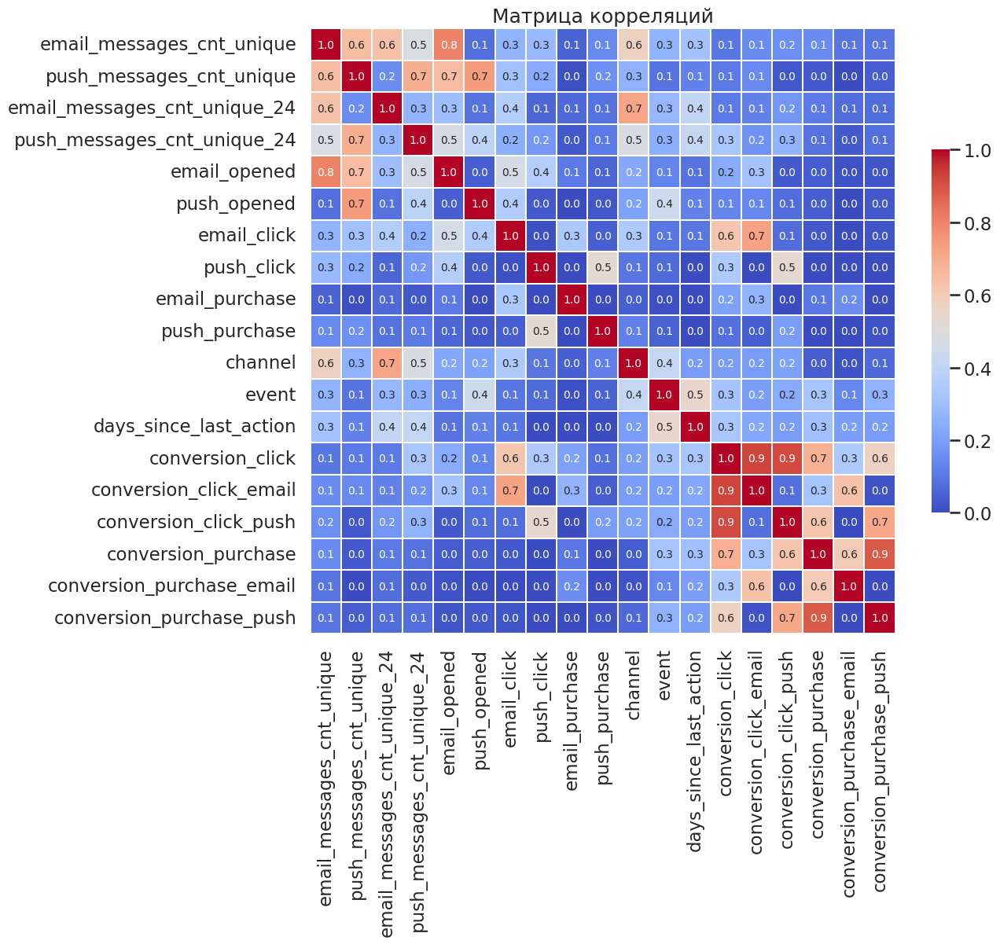

In [73]:
phik_matrix = final_messages_df.phik_matrix(interval_cols=num_cols)
plt.figure(figsize=(12, 10))
sns.heatmap(
    phik_matrix,
    annot=True,
    fmt=".1f",
    cmap="coolwarm",
    linewidths=0.2,
    annot_kws={"size": 10},
    cbar_kws={"shrink": 0.6}
)
plt.title("Матрица корреляций")
plt.show()

Комментарий: на текущем этапе можно исключить переменные с расчетом конверсии отдельно по емейл и пушам, т.к. эти переменные имеют высокую корреляцию с общей переменной по конверсии. Исключение - конверсия по емейлам в покупки, но это вероятно связано с общим снижением емейлов в последнее полугодие и переходом на пуши, но, как мы видели выше, именно с пушами будет связана динамика продаж в целевом периоде

In [74]:
# Временной порог для покупок

threshold = max_date - pd.Timedelta(days=THRESHOLD)

purch_selected['period_type'] = (purch_selected['date'] >= threshold).astype(int)

/tmp/ipython-input-1361246758.py:6: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy



In [75]:
purch_selected_period = purch_selected[purch_selected['period_type']==1]

In [76]:
# Показатели активности клиента по покупкам

client_activity = (
    purch_selected_period
    .groupby('client_id')
    .agg(
        total_purchases=('date', 'size'),
        total_spent=('amount', 'sum'),
        first_purchase_date=('date', 'min'),
        last_purchase_date=('date', 'max')
    )
    .reset_index()
)

client_activity['active_span_days'] = (
    client_activity['last_purchase_date'] - client_activity['first_purchase_date']
).dt.days + 1

# средняя частота покупок (покупок в день) на активном периоде

client_activity['purchases_per_day'] = (
    client_activity['total_purchases'] /
    ((client_activity['last_purchase_date'] - client_activity['first_purchase_date']).dt.days +1 )
)

client_activity = client_activity.set_index('client_id')

client_activity = client_activity.drop(['first_purchase_date', 'last_purchase_date'], axis = 1)

client_activity.head(5)

,total_purchases,total_spent,active_span_days,purchases_per_day
client_id,,,,
1515915625468060902,5,4795.0,1,5.000000
1515915625468061003,6,14135.0,1,6.000000
1515915625468061099,1,299.0,1,1.000000
1515915625468061100,1,1049.0,1,1.000000
1515915625468061170,7,14095.0,84,0.083333


In [77]:
# Подготовка для фичей по категориям и покупкам

cols = ['client_id', 'lvl_1', 'lvl_2']

clients_purchases = (
    purch_selected_period
    .groupby(cols, dropna=False)
    .agg(
        cnt=('client_id', 'size'),
        quantity=('quantity', 'sum'),
        sum_spent=('amount', 'sum'),
        first_purchase_date=('date', 'min'),
        last_purchase_date=('date', 'max')
    )
    .reset_index()
)

clients_purchases.head(5)

,client_id,lvl_1,lvl_2,cnt,quantity,sum_spent,first_purchase_date,last_purchase_date
0,1515915625468060902,4,27,2,2,1498.0,2022-05-27,2022-05-27
1,1515915625468060902,4,28,3,3,3297.0,2022-05-27,2022-05-27
2,1515915625468061003,4,28,6,6,14135.0,2023-01-04,2023-01-04
3,1515915625468061099,4,28,1,1,299.0,2022-05-17,2022-05-17
4,1515915625468061100,4,27,1,1,1049.0,2024-02-10,2024-02-10


In [78]:
# количество покупок и частота покупок в lvl_1
clients_purchases_qty = (
    clients_purchases
    .pivot_table(index='client_id', columns='lvl_1', values = 'quantity', aggfunc = 'sum')
    .fillna(0)
)


clients_purchases_qty.columns = [f'qty_{c}' for c in clients_purchases_qty.columns]


display(clients_purchases_qty.head(5))

,qty_2,qty_4,qty_5562,qty_5963,qty_6060
client_id,,,,,
1515915625468060902,0.0,5.0,0.0,0.0,0.0
1515915625468061003,0.0,6.0,0.0,0.0,0.0
1515915625468061099,0.0,1.0,0.0,0.0,0.0
1515915625468061100,0.0,1.0,0.0,0.0,0.0
1515915625468061170,1.0,6.0,0.0,0.0,0.0


In [79]:
# Последняя дата покупки и количество дней с момента покупки
clients_lastdt_wide = (
    clients_purchases
    .pivot_table(
        index='client_id',
        columns='lvl_1',
        values='last_purchase_date',
        aggfunc='max'
    )
)

days_since_last = (ref_date - clients_lastdt_wide).apply(lambda col: col.dt.days)
days_since_last.columns = [
    f'days_since_last_{c}' for c in days_since_last.columns
]


clients_lastdt_wide = days_since_last

clients_lastdt_wide = clients_lastdt_wide.fillna(10000)

clients_lastdt_wide.head(5)


,days_since_last_2,days_since_last_4,days_since_last_5562,days_since_last_5963,days_since_last_6060
client_id,,,,,
1515915625468060902,10000.0,629.0,10000.0,10000.0,10000.0
1515915625468061003,10000.0,407.0,10000.0,10000.0,10000.0
1515915625468061099,10000.0,639.0,10000.0,10000.0,10000.0
1515915625468061100,10000.0,5.0,10000.0,10000.0,10000.0
1515915625468061170,326.0,243.0,10000.0,10000.0,10000.0


In [111]:
# Топовая категория 2 уровня
clients_purchases['rank'] = (
    clients_purchases
    .groupby('client_id')['cnt']
    .rank(method='first', ascending=False)
)

clients_lvl_2_top = (
    clients_purchases
    .loc[clients_purchases['rank'] == 1, ['client_id', 'lvl_2', 'cnt']]
    .reset_index(drop=True)
)

clients_lvl_2_top = clients_lvl_2_top.set_index('client_id')

clients_lvl_2_top .head(5)

,lvl_2,cnt
client_id,,
1515915625468060902,28,3
1515915625468061003,28,6
1515915625468061099,28,1
1515915625468061100,27,1
1515915625468061170,28,6


In [112]:
clients_lvl_2_top['lvl_2'].value_counts(normalize = True).head(10)

,proportion
lvl_2,
28,0.481484
18,0.156375
27,0.049531
5630,0.046782
31,0.041506
5631,0.038377
5589,0.027985
29,0.025638
5633,0.017634


In [81]:
# Итоговый дф по покупкам
final_purchase_df = (
    clients_purchases_qty
    .join(clients_lastdt_wide)
    .join(clients_lvl_2_top['lvl_2'])
    .join(client_activity[['active_span_days', 'purchases_per_day', 'total_purchases', 'total_spent']]))

In [82]:
# Описательная статистика по новому дф
int_col = final_purchase_df.select_dtypes(include = ['float64','int64']).columns
quantitative_description(final_purchase_df, int_col)

Описательная статистика по переменной: qty_2


,qty_2
count,49848.0
mean,0.4
std,1.0
min,0.0
25%,0.0
50%,0.0
75%,0.0
max,30.0


Описательная статистика по переменной: qty_4


,qty_4
count,49848.0
mean,1.5
std,2.1
min,0.0
25%,0.0
50%,1.0
75%,2.0
max,95.0


Описательная статистика по переменной: qty_5562


,qty_5562
count,49848.0
mean,0.6
std,1.7
min,0.0
25%,0.0
50%,0.0
75%,0.0
max,42.0


Описательная статистика по переменной: qty_5963


,qty_5963
count,49848.0
mean,0.0
std,0.2
min,0.0
25%,0.0
50%,0.0
75%,0.0
max,13.0


Описательная статистика по переменной: qty_6060


,qty_6060
count,49848.0
mean,0.1
std,0.7
min,0.0
25%,0.0
50%,0.0
75%,0.0
max,34.0


Описательная статистика по переменной: days_since_last_2


,days_since_last_2
count,49848.0
mean,8052.5
std,3867.7
min,-1.0
25%,10000.0
50%,10000.0
75%,10000.0
max,10000.0


Описательная статистика по переменной: days_since_last_4


,days_since_last_4
count,49848.0
mean,3510.9
std,4516.7
min,-1.0
25%,287.0
50%,549.0
75%,10000.0
max,10000.0


Описательная статистика по переменной: days_since_last_5562


,days_since_last_5562
count,49848.0
mean,7693.5
std,4116.3
min,-1.0
25%,10000.0
50%,10000.0
75%,10000.0
max,10000.0


Описательная статистика по переменной: days_since_last_5963


,days_since_last_5963
count,49848.0
mean,9892.5
std,1018.7
min,-1.0
25%,10000.0
50%,10000.0
75%,10000.0
max,10000.0


Описательная статистика по переменной: days_since_last_6060


,days_since_last_6060
count,49848.0
mean,9660.7
std,1789.0
min,-1.0
25%,10000.0
50%,10000.0
75%,10000.0
max,10000.0


Описательная статистика по переменной: active_span_days


,active_span_days
count,49848.0
mean,22.1
std,76.8
min,1.0
25%,1.0
50%,1.0
75%,1.0
max,637.0


Описательная статистика по переменной: purchases_per_day


,purchases_per_day
count,49848.0
mean,1.8
std,1.9
min,0.0
25%,1.0
50%,1.0
75%,2.0
max,53.0


Описательная статистика по переменной: total_purchases


,total_purchases
count,49848.0
mean,2.5
std,2.8
min,1.0
25%,1.0
50%,2.0
75%,3.0
max,154.0


Описательная статистика по переменной: total_spent


,total_spent
count,49848.0
mean,3298.1
std,4384.6
min,1.0
25%,1165.8
50%,2099.0
75%,3998.0
max,297954.0


Комментарии:
- общее количество покупок на клиента: медиана 2 покупки, среднее 2,5 покупки, но есть настоящий фанаты покупок (максимум 154 покупок на клиента за рассматриваемый период)
- сумма покупок на клиента небольшая: медиана 2100 руб, среднее 3300 руб/
- категорию 4 покупает 50% клиентов, категорию 2 25% клиентов. Однако у распределения клиентов по покупкам каждой категории есть очень длинный правый хвост – настоящие фанаты каждой категории
- медиана по частоте покупок 1 предмет в день, среднее – 2 покупки в день (из дней, когда клиент был активен)

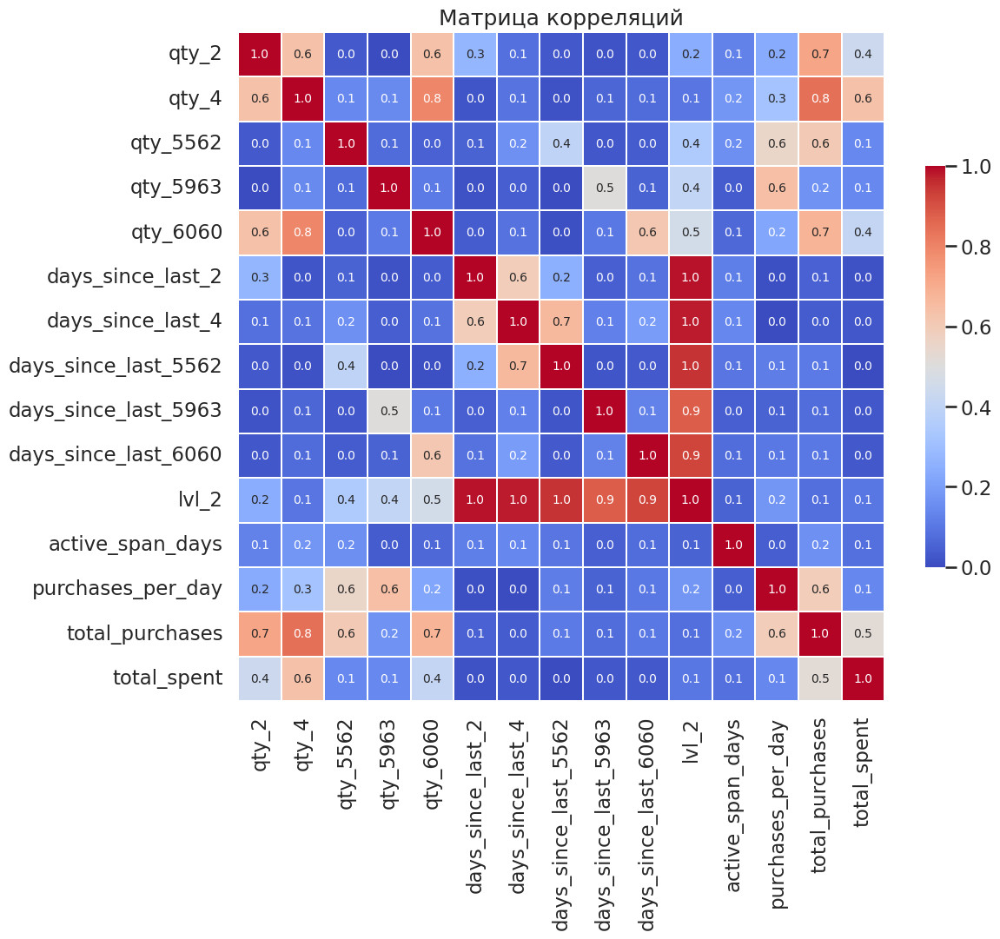

In [109]:
# Корреляционный анализ

phik_matrix = final_purchase_df.phik_matrix(interval_cols=int_col)
plt.figure(figsize=(12, 10))
sns.heatmap(
    phik_matrix,
    annot=True,
    fmt=".1f",
    cmap="coolwarm",
    linewidths=0.2,
    annot_kws={"size": 10},
    cbar_kws={"shrink": 0.6}
)
plt.title("Матрица корреляций")
plt.show()

Комментарии:
- высокая корреляция у наиболее предпочитаемой категории 2го уровня и дней с момента последней покупки. Вероятно, посление покупки приходятся на наиболее популярную категорию. Этот признак для обучения не будем использовать
- также высокая корреляция между количеством покупок в целом и по категориям отдельно, попробуем обучать модель с разным составом признаков

In [84]:
target = target.set_index('client_id')

In [85]:
# собираем всё
client_lvl1_features = (
    final_purchase_df
    .join(final_messages_df)
    .join(target)
    .reset_index()
)

client_lvl1_features.head(5)

,client_id,qty_2,qty_4,qty_5562,qty_5963,qty_6060,days_since_last_2,days_since_last_4,days_since_last_5562,days_since_last_5963,...,channel,event,days_since_last_action,conversion_click,conversion_click_email,conversion_click_push,conversion_purchase,conversion_purchase_email,conversion_purchase_push,target
0,1515915625468060902,0.0,5.0,0.0,0.0,0.0,10000.0,629.0,10000.0,10000.0,...,email,unsubscribe,27.0,4.7,4.7,0.0,0.8,0.8,0.0,0
1,1515915625468061003,0.0,6.0,0.0,0.0,0.0,10000.0,407.0,10000.0,10000.0,...,email,send,2.0,2.6,2.6,0.0,0.6,0.6,0.0,1
2,1515915625468061099,0.0,1.0,0.0,0.0,0.0,10000.0,639.0,10000.0,10000.0,...,email,send,2.0,3.7,5.1,0.0,0.0,0.0,0.0,0
3,1515915625468061100,0.0,1.0,0.0,0.0,0.0,10000.0,5.0,10000.0,10000.0,...,mobile_push,open,0.0,0.4,0.0,0.4,0.4,0.0,0.4,0
4,1515915625468061170,1.0,6.0,0.0,0.0,0.0,326.0,243.0,10000.0,10000.0,...,email,send,0.0,4.9,7.3,0.0,1.2,1.8,0.0,0


In [113]:
client_lvl1_features.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 49848 entries, 0 to 49847
Data columns (total 36 columns):
 #   Column                        Non-Null Count  Dtype  
---  ------                        --------------  -----  
 0   client_id                     49848 non-null  int64  
 1   qty_2                         49848 non-null  float64
 2   qty_4                         49848 non-null  float64
 3   qty_5562                      49848 non-null  float64
 4   qty_5963                      49848 non-null  float64
 5   qty_6060                      49848 non-null  float64
 6   days_since_last_2             49848 non-null  float64
 7   days_since_last_4             49848 non-null  float64
 8   days_since_last_5562          49848 non-null  float64
 9   days_since_last_5963          49848 non-null  float64
 10  days_since_last_6060          49848 non-null  float64
 11  lvl_2                         49848 non-null  object 
 12  active_span_days              49848 non-null  int64  
 13  p

In [87]:
# Отсутствующие значения по рекалмным кампаниям заполняем заглушкой (там все переменные количественные)
num_cols = client_lvl1_features.select_dtypes(include = ['float64', 'int64']).columns
nom_cols = client_lvl1_features.select_dtypes(include = 'object').columns

client_lvl1_features[num_cols] = client_lvl1_features[num_cols].fillna(-1)
client_lvl1_features[nom_cols] = client_lvl1_features[nom_cols].fillna('unknown')

In [88]:
client_lvl1_features.isna().sum()

,0
client_id,0
qty_2,0
qty_4,0
qty_5562,0
qty_5963,0
qty_6060,0
days_since_last_2,0
days_since_last_4,0
days_since_last_5562,0
days_since_last_5963,0


In [89]:
client_lvl1_features.columns.tolist()

['client_id',
 'qty_2',
 'qty_4',
 'qty_5562',
 'qty_5963',
 'qty_6060',
 'days_since_last_2',
 'days_since_last_4',
 'days_since_last_5562',
 'days_since_last_5963',
 'days_since_last_6060',
 'lvl_2',
 'active_span_days',
 'purchases_per_day',
 'total_purchases',
 'total_spent',
 'email_messages_cnt_unique',
 'push_messages_cnt_unique',
 'email_messages_cnt_unique_24',
 'push_messages_cnt_unique_24',
 'email_opened',
 'push_opened',
 'email_click',
 'push_click',
 'email_purchase',
 'push_purchase',
 'channel',
 'event',
 'days_since_last_action',
 'conversion_click',
 'conversion_click_email',
 'conversion_click_push',
 'conversion_purchase',
 'conversion_purchase_email',
 'conversion_purchase_push',
 'target']

In [122]:
#Итоговый список полей для модели
cols = [  'qty_2',
 'qty_4',
 'qty_5562',
 'qty_5963',
 'qty_6060',
 'days_since_last_2',
 'days_since_last_4',
 'days_since_last_5562',
 'days_since_last_5963',
 'days_since_last_6060',
 'push_messages_cnt_unique_24',
 'active_span_days',
 'purchases_per_day',
 'total_purchases',
 'total_spent',
 'email_messages_cnt_unique',
 'push_messages_cnt_unique',
 'email_opened',
 'push_opened',
 'email_click',
 'push_click',
 'email_purchase',
 'push_purchase',
 'channel',
 'event',
 'days_since_last_action',
 'conversion_click',
 'conversion_purchase',
         'target']

data_model = client_lvl1_features[cols]

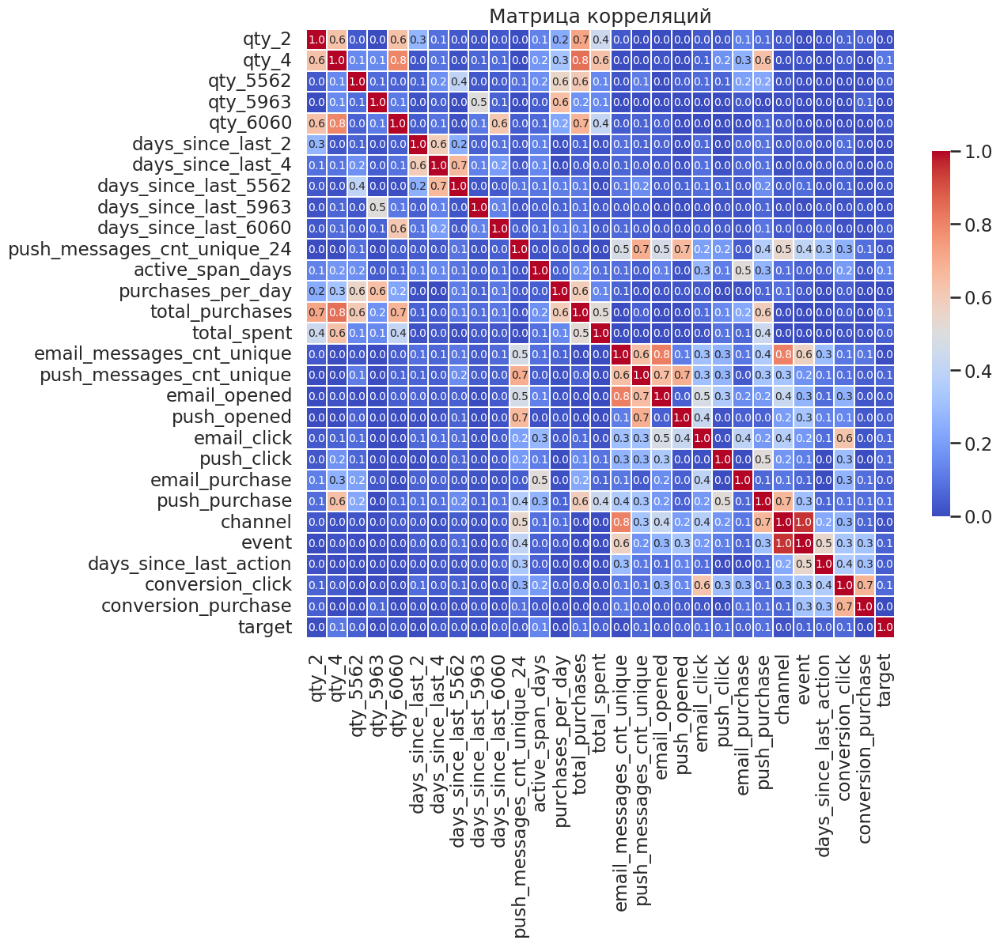

In [123]:
# Финальный корреляционный анализ
int_col = data_model.select_dtypes(include = ['float64','int64']).columns
nom_col = data_model.select_dtypes(include = ['object']).columns
phik_matrix = data_model.phik_matrix(interval_cols=int_col)
plt.figure(figsize=(12, 10))
sns.heatmap(
    phik_matrix,
    annot=True,
    fmt=".1f",
    cmap="coolwarm",
    linewidths=0.2,
    annot_kws={"size": 10},
    cbar_kws={"shrink": 0.6}
)
plt.title("Матрица корреляций")
plt.show()

## Обучение моделей, оценка качества моделей и анализ важности признаков

План работ:
- выделить тренировочную и валидационную выборки
- подготовить данные для моделей
- подобрать параметры с помощью optuna
- оценить качество модели, вывести наиболее важные переменные


Модели для обучения:
Для классиикации предлагается выбрать Случайный лес и градиентные бустинги (2 разных библиотеки). Эти типы модели наиболее устойчивы к переобучению и влиянию шумов и аномалий, что важно в условиях дисбаланса классов

In [154]:
# Разделение на трейн и тест

X = data_model.drop('target', axis=1)
y = data_model['target']
X_train, X_valid, y_train, y_valid = train_test_split(
    X, y,
    test_size=0.35,
    stratify=y,
    random_state=RANDOM_STATE
)

print(X_train.shape)
print(X_valid.shape)

(32401, 28)
(17447, 28)


In [155]:
int_col = X.select_dtypes(include = ['float64','int64']).columns
nom_col = X.select_dtypes(include = ['object']).columns

In [156]:
# Кодирование и скейл
numeric_pipeline = Pipeline([
    ('scaler', MinMaxScaler())
])

categorical_pipeline = Pipeline([
    ('ohe', OneHotEncoder(handle_unknown='ignore', sparse_output=False))])

full_preprocessor = ColumnTransformer([
    ('numeric', numeric_pipeline, int_col),
    ('categorical', categorical_pipeline, nom_col)
], remainder='drop')


In [157]:
# Обработка

X_train_proc = full_preprocessor.fit_transform(X_train)
X_valid_proc = full_preprocessor.transform(X_valid)

feature_names = full_preprocessor.get_feature_names_out()


print(X_train_proc.shape)
print(X_valid_proc.shape)
print(feature_names)

(32401, 38)
(17447, 38)
['numeric__qty_2' 'numeric__qty_4' 'numeric__qty_5562' 'numeric__qty_5963'
 'numeric__qty_6060' 'numeric__days_since_last_2'
 'numeric__days_since_last_4' 'numeric__days_since_last_5562'
 'numeric__days_since_last_5963' 'numeric__days_since_last_6060'
 'numeric__push_messages_cnt_unique_24' 'numeric__active_span_days'
 'numeric__purchases_per_day' 'numeric__total_purchases'
 'numeric__total_spent' 'numeric__email_messages_cnt_unique'
 'numeric__push_messages_cnt_unique' 'numeric__email_opened'
 'numeric__push_opened' 'numeric__email_click' 'numeric__push_click'
 'numeric__email_purchase' 'numeric__push_purchase'
 'numeric__days_since_last_action' 'numeric__conversion_click'
 'numeric__conversion_purchase' 'categorical__channel_email'
 'categorical__channel_mobile_push' 'categorical__channel_unknown'
 'categorical__event_click' 'categorical__event_complain'
 'categorical__event_hard_bounce' 'categorical__event_open'
 'categorical__event_purchase' 'categorical__ev

In [158]:
# Параметры моделей и подготовка функций для Optuna
cv = StratifiedKFold(n_splits=3, shuffle=True, random_state=RANDOM_STATE)


# RandomForest параметры
def objective_rf(trial: optuna.Trial) -> float:
    params = {
        "n_estimators": trial.suggest_int("n_estimators", 200, 500),
        "max_depth": trial.suggest_categorical("max_depth", [None, 10, 20]),
        "min_samples_leaf": trial.suggest_int("min_samples_leaf", 1, 3),
        "max_features": trial.suggest_categorical("max_features", ["sqrt", "log2"]),
        "class_weight": trial.suggest_categorical("class_weight", [None, "balanced"]),
        "random_state": RANDOM_STATE,
        "n_jobs": -1,
    }

    model = RandomForestClassifier(**params)
    score = cross_val_score(
        model, X_train_proc, y_train,
        cv=cv, scoring="roc_auc", n_jobs=-1
    ).mean()
    return score


# LightGBM параметры
def objective_lgbm(trial: optuna.Trial) -> float:
    params = {
        "num_leaves": trial.suggest_int("num_leaves", 31, 63),
        "learning_rate": trial.suggest_float("learning_rate", 0.03, 0.1, log=True),
        "n_estimators": trial.suggest_int("n_estimators", 200, 600),
        "max_depth": trial.suggest_categorical("max_depth", [-1, 7, 11]),
        "feature_fraction": trial.suggest_float("feature_fraction", 0.7, 0.9),
        "subsample": trial.suggest_float("subsample", 0.7, 0.9),
        "reg_lambda": trial.suggest_float("reg_lambda", 0.0, 2.0),
        "n_jobs": -1,
        "random_state": RANDOM_STATE,
    }

    model = LGBMClassifier(**params)
    score = cross_val_score(
        model, X_train_proc, y_train,
        cv=cv, scoring="roc_auc", n_jobs=-1
    ).mean()
    return score


# CatBoost параметры
def objective_cat(trial: optuna.Trial) -> float:
    params = {
        "depth": trial.suggest_int("depth", 4, 8),
        "learning_rate": trial.suggest_float("learning_rate", 0.03, 0.1, log=True),
        "iterations": trial.suggest_int("iterations", 300, 800),
        "l2_leaf_reg": trial.suggest_float("l2_leaf_reg", 1.0, 9.0),
        "scale_pos_weight": trial.suggest_float("scale_pos_weight", 1.0, 4.0),
        "loss_function": "Logloss",
        "eval_metric": "AUC",
        "random_state": RANDOM_STATE,
        "thread_count": -1,
        "verbose": False,
    }

    model = CatBoostClassifier(**params)
    score = cross_val_score(
        model, X_train_proc, y_train,
        cv=cv, scoring="roc_auc", n_jobs=-1
    ).mean()
    return score



In [159]:

# Оптимизация
if __name__ == "__main__":
    # RandomForest
    study_rf = optuna.create_study(direction="maximize", study_name="rf_roc_auc")
    study_rf.optimize(objective_rf, n_trials=20)
    print("RF лучший ROC-AUC:", study_rf.best_value)
    print("RF лучшие параметры:", study_rf.best_params)

    # LightGBM
    study_lgbm = optuna.create_study(direction="maximize", study_name="lgbm_roc_auc")
    study_lgbm.optimize(objective_lgbm, n_trials=20)
    print("LGBM лучший ROC-AUC:", study_lgbm.best_value)
    print("LGBM лучшие параметры:", study_lgbm.best_params)

    # CatBoost
    study_cat = optuna.create_study(direction="maximize", study_name="cat_roc_auc")
    study_cat.optimize(objective_cat, n_trials=20)
    print("CatBoost лучший ROC-AUC:", study_cat.best_value)
    print("CatBoost лучшие параметры:", study_cat.best_params)

[I 2025-12-05 20:04:55,605] A new study created in memory with name: rf_roc_auc
[I 2025-12-05 20:05:20,843] Trial 0 finished with value: 0.6825838502157957 and parameters: {'n_estimators': 261, 'max_depth': None, 'min_samples_leaf': 2, 'max_features': 'sqrt', 'class_weight': 'balanced'}. Best is trial 0 with value: 0.6825838502157957.
[I 2025-12-05 20:05:45,799] Trial 1 finished with value: 0.7083671429759653 and parameters: {'n_estimators': 204, 'max_depth': None, 'min_samples_leaf': 3, 'max_features': 'sqrt', 'class_weight': None}. Best is trial 1 with value: 0.7083671429759653.
[I 2025-12-05 20:06:42,336] Trial 2 finished with value: 0.713579612431713 and parameters: {'n_estimators': 477, 'max_depth': 20, 'min_samples_leaf': 1, 'max_features': 'sqrt', 'class_weight': None}. Best is trial 2 with value: 0.713579612431713.
[I 2025-12-05 20:07:20,697] Trial 3 finished with value: 0.7199143704009591 and parameters: {'n_estimators': 392, 'max_depth': 20, 'min_samples_leaf': 3, 'max_featur

RF лучший ROC-AUC: 0.7406807815849148
RF лучшие параметры: {'n_estimators': 289, 'max_depth': 10, 'min_samples_leaf': 3, 'max_features': 'sqrt', 'class_weight': None}


/usr/local/lib/python3.12/dist-packages/joblib/externals/loky/process_executor.py:782: UserWarning:

A worker stopped while some jobs were given to the executor. This can be caused by a too short worker timeout or by a memory leak.

[I 2025-12-05 20:14:55,038] Trial 0 finished with value: 0.631390213572552 and parameters: {'num_leaves': 58, 'learning_rate': 0.07708086745548343, 'n_estimators': 580, 'max_depth': 11, 'feature_fraction': 0.8205356426556503, 'subsample': 0.8919438504724038, 'reg_lambda': 0.37902872374589003}. Best is trial 0 with value: 0.631390213572552.
/usr/local/lib/python3.12/dist-packages/joblib/externals/loky/process_executor.py:782: UserWarning:

A worker stopped while some jobs were given to the executor. This can be caused by a too short worker timeout or by a memory leak.

[I 2025-12-05 20:15:24,796] Trial 1 finished with value: 0.6614536477549092 and parameters: {'num_leaves': 47, 'learning_rate': 0.03657052018340331, 'n_estimators': 492, 'max_depth': -1, 'feat

LGBM лучший ROC-AUC: 0.7241554012692731
LGBM лучшие параметры: {'num_leaves': 51, 'learning_rate': 0.0408840467832374, 'n_estimators': 200, 'max_depth': 7, 'feature_fraction': 0.881407263379935, 'subsample': 0.7014022528477872, 'reg_lambda': 1.9953118295369612}


[I 2025-12-05 20:19:46,725] Trial 0 finished with value: 0.696421456061148 and parameters: {'depth': 7, 'learning_rate': 0.07371623590836417, 'iterations': 320, 'l2_leaf_reg': 7.6181787877893115, 'scale_pos_weight': 3.869425388113805}. Best is trial 0 with value: 0.696421456061148.
[I 2025-12-05 20:20:17,904] Trial 1 finished with value: 0.666446460768951 and parameters: {'depth': 5, 'learning_rate': 0.09262903297729845, 'iterations': 786, 'l2_leaf_reg': 8.404000000076849, 'scale_pos_weight': 3.4299169513421015}. Best is trial 0 with value: 0.696421456061148.
[I 2025-12-05 20:20:31,957] Trial 2 finished with value: 0.743205229351365 and parameters: {'depth': 5, 'learning_rate': 0.08994389517167453, 'iterations': 325, 'l2_leaf_reg': 8.502632781172803, 'scale_pos_weight': 1.139536355863194}. Best is trial 2 with value: 0.743205229351365.
[I 2025-12-05 20:20:59,662] Trial 3 finished with value: 0.7100159732291481 and parameters: {'depth': 6, 'learning_rate': 0.04824088961774868, 'iteratio

CatBoost лучший ROC-AUC: 0.744585950770919
CatBoost лучшие параметры: {'depth': 5, 'learning_rate': 0.06634006255767701, 'iterations': 311, 'l2_leaf_reg': 8.74609484297089, 'scale_pos_weight': 1.7997362210273087}


In [160]:
scores = {
        "rf": study_rf.best_value,
        "lgbm": study_lgbm.best_value,
        "cat": study_cat.best_value,
    }


best_model_name = max(scores, key=scores.get)
print(f"\nЛучший тип модели: {best_model_name}, CV ROC-AUC = {scores[best_model_name]:.4f}")


Лучший тип модели: cat, CV ROC-AUC = 0.7446


Комментарий: таким образом, у нас наилучшая модель CatBoost с целевой метрикой 0.75

Далее посмотрим все метрики, включая пресижен и риколл на трейне и валидационной выборке.

In [161]:
best_params = study_cat.best_params.copy()
best_params.update({
            "loss_function": "Logloss",
            "eval_metric": "AUC",
            "random_state": RANDOM_STATE,
            "thread_count": -1,
            "verbose": False,
        })
best_model = CatBoostClassifier(**best_params)

In [162]:
best_model.fit(X_train_proc, y_train)

y_pred = best_model.predict(X_train_proc)
y_proba = best_model.predict_proba(X_train_proc)[:, 1]

roc_auc = roc_auc_score(y_train, y_proba)
print(f"\nROC-AUC лучшей модели на тренировочной выборе: {roc_auc:.4f}")

precision = precision_score(y_train, y_pred)
print(f"\nПресиджен лучшей модели на тренировочной выборе: {precision:.4f}")

recall = recall_score(y_train, y_pred)
print(f"\nРиколл лучшей модели на тренировочной выборе: {recall:.4f}")


ROC-AUC лучшей модели на тренировочной выборе: 0.8301

Пресиджен лучшей модели на тренировочной выборе: 0.9815

Риколл лучшей модели на тренировочной выборе: 0.0848


In [163]:
best_model.fit(X_train_proc, y_train)

y_pred = best_model.predict(X_valid_proc)
y_proba = best_model.predict_proba(X_valid_proc)[:, 1]

roc_auc = roc_auc_score(y_valid, y_proba)
print(f"\nROC-AUC лучшей модели на валидационной выборке: {roc_auc:.4f}")

precision = precision_score(y_valid, y_pred)
print(f"\nПресижен лучшей модели на валидационной выборке: {precision:.4f}")

recall = recall_score(y_valid, y_pred)
print(f"\nРиколл лучшей модели на валидационной выборке: {recall:.4f}")


ROC-AUC лучшей модели на валидационной выборке: 0.7646

Пресижен лучшей модели на валидационной выборке: 0.2857

Риколл лучшей модели на валидационной выборке: 0.0060


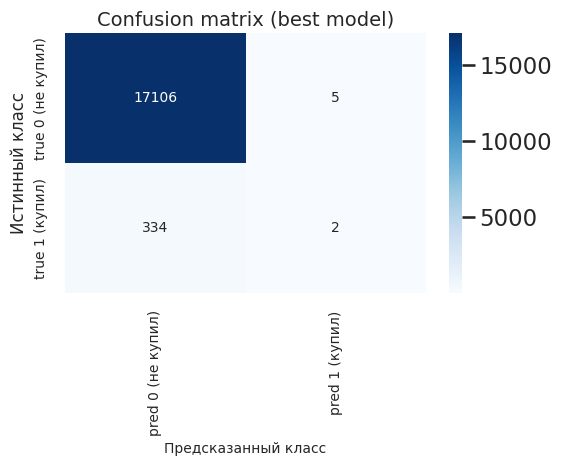

In [164]:
cm = confusion_matrix(y_valid, y_pred)

plt.figure(figsize=(6, 5))
ax = sns.heatmap(
        cm, annot=True, fmt="d", cmap="Blues",
        xticklabels=["pred 0 (не купил)", "pred 1 (купил)"],
        yticklabels=["true 0 (не купил)", "true 1 (купил)"],
        annot_kws={"size": 10}
    )
ax.set_ylabel("Истинный класс", fontsize=12)
ax.set_xlabel("Предсказанный класс", fontsize=10)
ax.set_title("Confusion matrix (best model)", fontsize=14)

ax.tick_params(axis='x', labelsize=10)
ax.tick_params(axis='y', labelsize=10)

plt.tight_layout()
plt.show()

В целом модель плохая из-за дисбаланса классов, несмотря на хороший roc_auc. Модель ожидаемо хорошо предсказывает класс 0, но плохо предсказывает класс 1

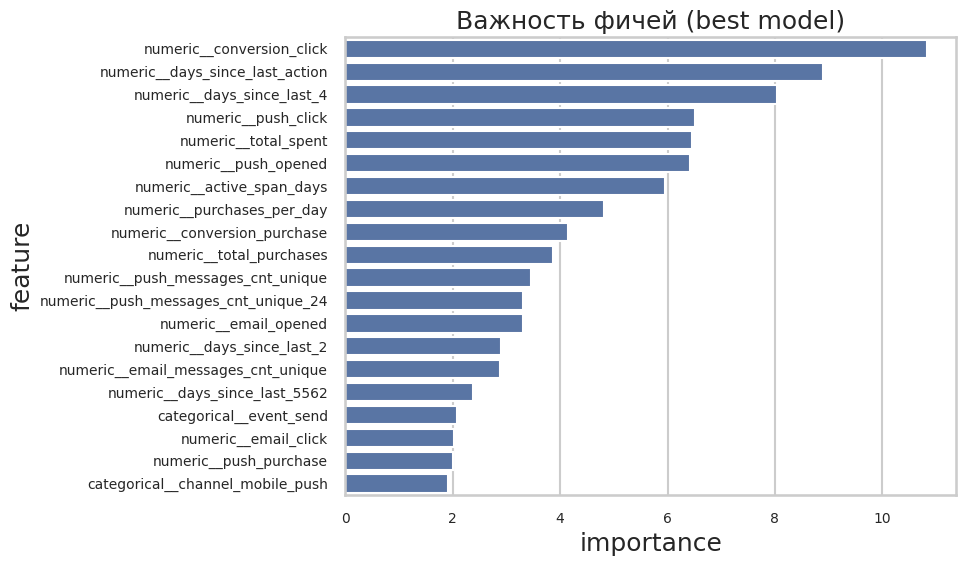

In [165]:
importances = best_model.feature_importances_

fi = pd.DataFrame({
        "feature": feature_names,
        "importance": importances
    }).sort_values("importance", ascending=False)

plt.figure(figsize=(10, 6))
ax = sns.barplot(
        data=fi.head(20),
        x="importance",
        y="feature",
        orient="h"
    )

ax.tick_params(axis='x', labelsize=10)
ax.tick_params(axis='y', labelsize=10)

ax.set_title("Важность фичей (best model)")
plt.tight_layout()
plt.show()

Наиболее важные переменные: коверсия отправленных сообщений в клики, количество дней с последней активности клиента и последней активности по 4 категории, количество кликов по пушаем, количество открытых пушей потраченные средства, активность клиента (количество покупок в день, длительность совершения покупок в магазине, общее количество покупок).
Модель, вероятно, тоже уловила закономерность между отправкой пушей и покупками, а также влияние общей "лояльности" клиента магазину (длительность покупок, частота, траты). Вероятно, модель хорошо отсекает неактивных клиентов, но среди умеренно активных предсказывает покупки плохо

**Общие выводы:**
В рамках данного исследования были рассмотрены исторические данные по рекламным кампаниям и покупкам на маркетплейсе.

По историческим данным мы видим следующие тенденции:
- в наблюдаемом периоде снижается общая сумма и количество приобретенных товаров
- растет средняя сумма трат на клиента и среднее колиество покупок на клиента
- само количество активных и покупающих клиентов у нас снижается с середины 2023 года несмотря на рост интенсивности рекламных кампаний (вероятно, кампании "бьют" эффективно не во все категории клиентов)
- в рекламных кампаниях набллюдается переход от рассылок емейлов к рассылкам пушей, которые судя по динамике исторических показателей, влияют на продажи
- динамика количества уникальных клиентов, совершивших покупку, по категориям 1 уровня одинаковая, то есть нет падений определенных категорий, снижении продаж общее
- средние цены товаров по категориям не имеют выраженной динамики к росту или снижению в наблюдаемом периоде

На основании исследовательского анализа данных были построены следующие признаки:
- количество покупок (в целом и по категориям);
- время с момента последней покупки (в целом и по категориям);
- частота покупок клиента в день;
- длительность взаимодействия с пользователем (от первой до последней покупки);
- число полученных рекламных сообщений (в целом и по каналам);
- количество позитивных действий с рекламными сообщениями (переходы, покупки);
- время с момента последнего сообщения и действие с ним;
- пользовательская конверсия (доля покупок от полученных сообщений).

На основании корреляционного анализа отобраны наиболее перспективные признаки, удалены признаки с высокой линейной корреляцией с отобранными признаками.

Необходимо отметить, что целевая переменная имеет существенный дисбаланс классов, где класс 1 имеет только 2% наблюдений. В связи с этим была проведена стратификации при разделении на тренировочную и валидационную выборки.

Для обучения выбраны 2 типа классификационных моделей - Случайный лес и градиентный бустинг (построен на двух различных библиотеках LightGBM и CatBoost). Целевая метрика: roc-auc. В итоге наилучшие результаты показала CatBoost  с целевой метрикой 0.75.

Наиболее важные признаки: активность по пушам (клики, открытия, конверсия) и общая активность клиента в магазине